In [1]:
import logging
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from pyobsbox import Checker

In [3]:
logging.getLogger("pyobsbox").setLevel(logging.WARNING)
logging.getLogger("pyobsbox.plotter").setLevel(logging.DEBUG)

# List models

In [4]:
models_folder = Path("../../models")

In [5]:
[model.name for model in list(models_folder.glob('model_*'))]

['model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_abs_diff_seed_42',
 'model_dense_512_128_32_8_B1H_Inst_center_scale_100_seed_42',
 'model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_seed_42',
 'model_time_dist_32_16_B1H_Inst_500',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_stride_4_B1H_Inst',
 'model_conv_32_16_stride_4_B1H_Inst_jorg',
 'model_conv_max_pool_64_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_1000_seed_42',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_min_max_rolling_avg_std_window_2049_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_10000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_1000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_znorm_seed_42',
 'model_conv_32

In [6]:
model_path = models_folder / "model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_min_max_rolling_avg_std_window_65_seed_42"

In [7]:
checker = Checker(model_path)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 512, 64)           960       
_________________________________________________________________
dropout (Dropout)            (None, 512, 64)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 128, 32)           14368     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128, 32)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 32, 16)            3600      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 16)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 8, 8)              9

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

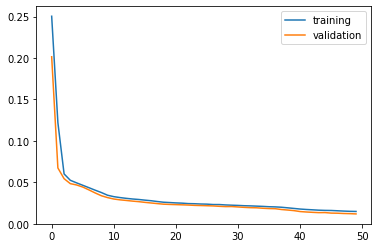

In [8]:
checker.plot_loss()

In [9]:
train_data, train_meta = checker.load_train_dataset()
train_prediction = checker.predict(train_data)

bunch_sorted_index: [1 2 0]
group_bunches: [2882.  607. 1787.]
group_bunches sorted: [ 607. 1787. 2882.]
restore_index: [2 0 1]
group_bunches restored: [2882.  607. 1787.]
bunch_sorted_index: [0 2 1]
group_bunches: [ 327. 2469. 1538.]
group_bunches sorted: [ 327. 1538. 2469.]
restore_index: [0 2 1]
group_bunches restored: [ 327. 2469. 1538.]

50/50 [==============================] - 96s 2s/step


In [10]:
train_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
6439,Inst,7101,1,h,7,2018-08-30 01:57:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7101/...,2556,2963.0,2203.0,65536,25
4056,Inst,7109,1,h,7,2018-08-31 19:45:56,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7109/...,924,517.0,371.0,65536,15
7530,Inst,7450,1,h,7,2018-11-17 03:44:26,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7450/...,612,2201.0,408.0,65536,29
3288,Inst,7109,1,h,7,2018-08-31 19:45:56,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7109/...,924,517.0,371.0,65536,12
6846,Inst,6761,1,h,7,2018-06-05 19:00:39,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6761/...,108,165.0,90.0,65536,26


In [11]:
train_meta.shape

(396800, 12)

In [12]:
train_data.shape

(396800, 2048, 2)

In [13]:
train_prediction.shape

(396800, 2048, 2)

In [14]:
validation_data, validation_meta = checker.load_validation_dataset()
validation_prediction = checker.predict(validation_data)


5/5 [==============================] - 14s 3s/step


In [15]:
validation_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
4808,Inst,7114,1,h,7,2018-09-01 21:27:45,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7114/...,636,416.0,284.0,65536,18
1244,Inst,6245,1,h,7,2017-09-26 17:14:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6245/...,1916,3300.0,1821.0,65536,4
5767,Inst,6850,1,h,7,2018-06-26 21:47:12,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6850/...,603,343.0,80.0,65536,22
7206,Inst,6696,1,h,7,2018-05-18 02:26:13,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6696/...,2556,342.0,222.0,65536,28
7624,Inst,7114,1,h,7,2018-09-01 21:27:45,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7114/...,636,416.0,284.0,65536,29


In [16]:
validation_meta.shape

(39680, 12)

In [17]:
validation_data.shape

(39680, 2048, 2)

In [18]:
validation_prediction.shape

(39680, 2048, 2)

In [19]:
def plot_train_index(index: int):
    """Helper function to plot a sample from the train dataset.
    """
    true_signal = train_data[index]
    predicted_signal = train_prediction[index]
    metadata_row = train_meta.iloc[index]
    print(f"index: {index}")
    print(f"Error: {train_error[index]}")
    print(metadata_row)
    checker.plot_sample(metadata_row, true_signal, predicted_signal)
    plt.show()
    encoded = checker.encode(true_signal)
    plt.imshow(encoded)
    plt.show()

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

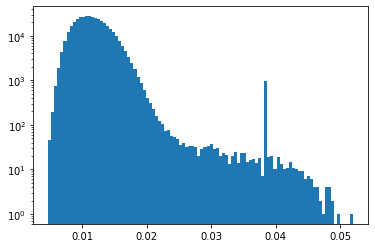

In [20]:
train_error = checker.MSE(train_data, train_prediction)
checker.plot_error(train_error, bins=100)

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

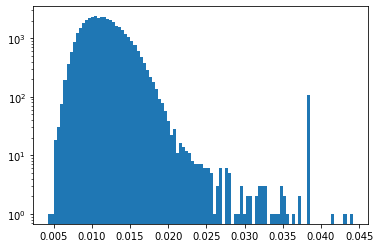

In [21]:
validation_error = checker.MSE(validation_data, validation_prediction)
checker.plot_error(validation_error, bins=100)

In [22]:
# Histogram peak
hist, bins = np.histogram(train_error, bins=100)
hist_peak = bins[np.argmax(hist)]

index: 0
Error: 0.01138541279630599
type                                                         Inst
fill                                                         7101
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-30 01:57:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7101/...
n_bunches                                                    2556
bunch_index                                                  2963
bunch_number                                                 2203
ts_length                                                   65536
chunk                                                          25
Name: 6439, dtype: object


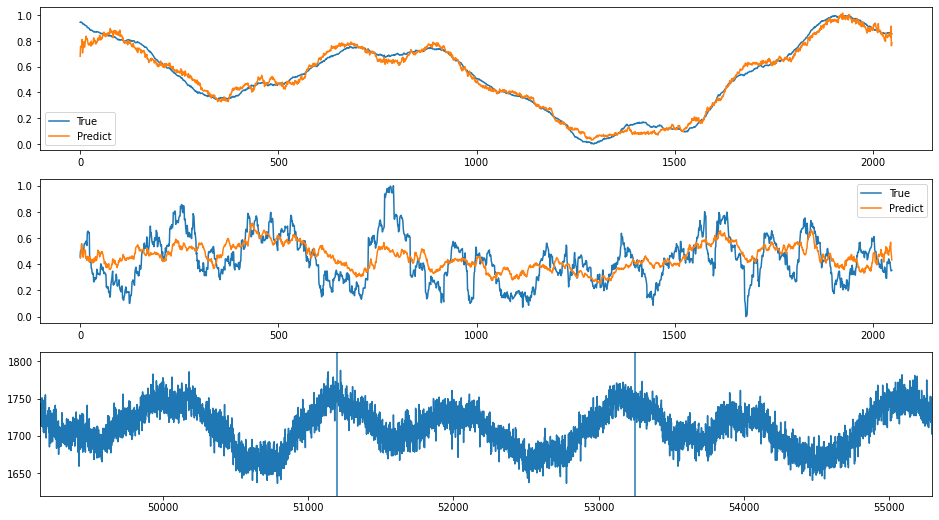

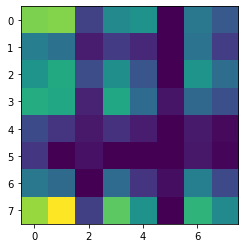

In [23]:
# plotting a random sample
plot_train_index(0)

In [24]:
sorted_error_indices = np.argsort(train_error)

# From left to right

index: 346195
Error: 0.004739676329533819
type                                                         Inst
fill                                                         6968
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-24 07:39:35
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6968/...
n_bunches                                                     396
bunch_index                                                   465
bunch_number                                                  326
ts_length                                                   65536
chunk                                                           7
Name: 2015, dtype: object


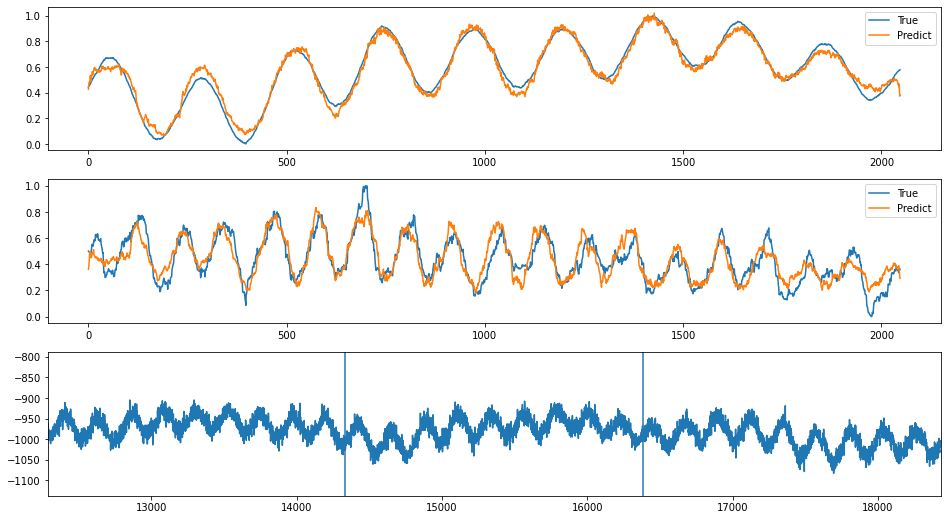

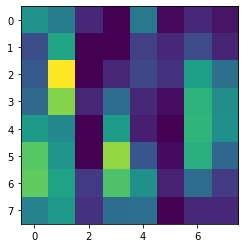

index: 298674
Error: 0.00475509102997345
type                                                         Inst
fill                                                         6854
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-27 21:40:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6854/...
n_bunches                                                     601
bunch_index                                                   450
bunch_number                                                  176
ts_length                                                   65536
chunk                                                          23
Name: 6076, dtype: object


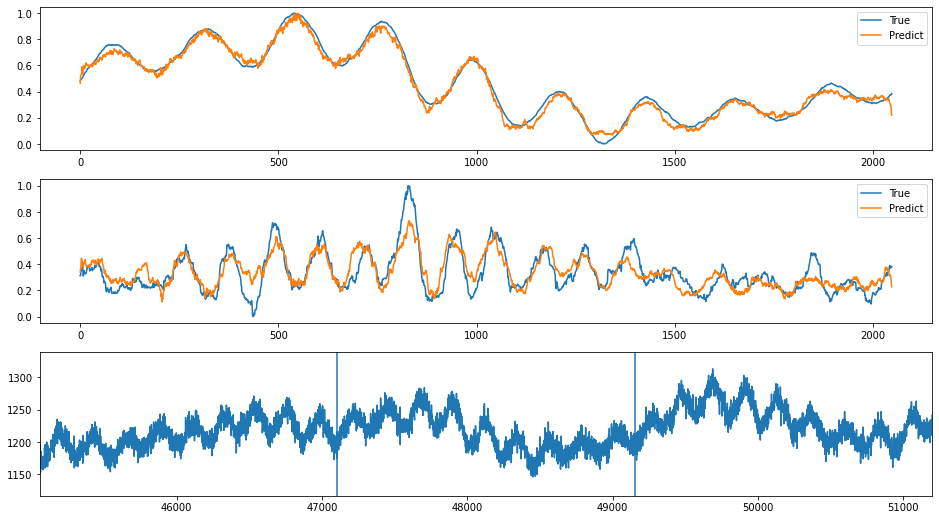

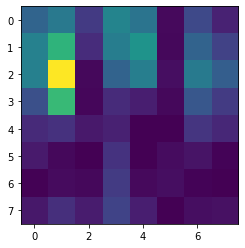

index: 381769
Error: 0.004785878269496743
type                                                         Inst
fill                                                         7159
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-13 05:19:45
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7159/...
n_bunches                                                     156
bunch_index                                                    72
bunch_number                                                   23
ts_length                                                   65536
chunk                                                          16
Name: 4164, dtype: object


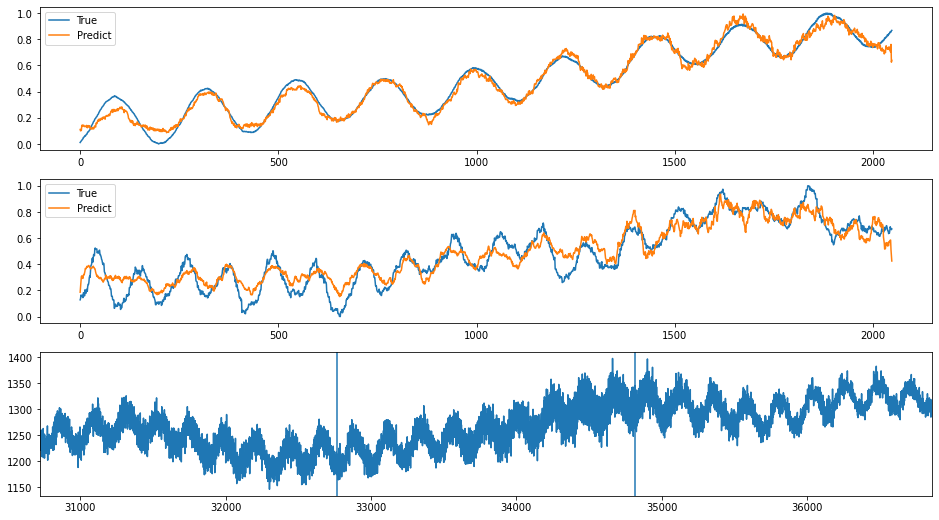

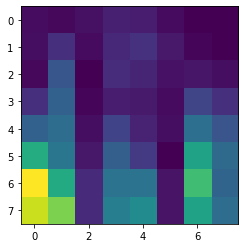

index: 162789
Error: 0.004796121520873961
type                                                         Inst
fill                                                         6337
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-27 05:29:05
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6337/...
n_bunches                                                    1132
bunch_index                                                  1369
bunch_number                                                  741
ts_length                                                   65536
chunk                                                          12
Name: 3286, dtype: object


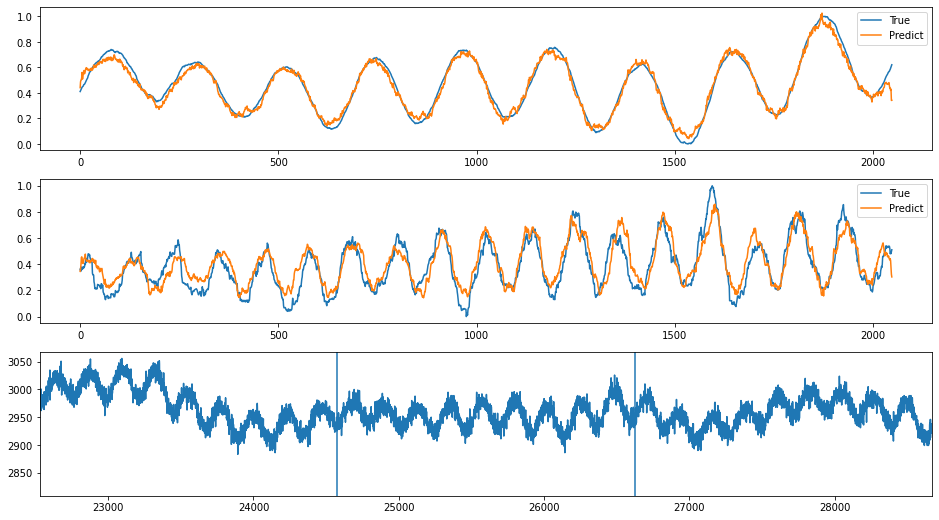

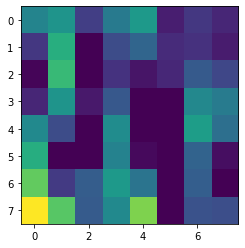

index: 343337
Error: 0.00481600774248048
type                                                         Inst
fill                                                         7477
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-26 22:23:37
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7477/...
n_bunches                                                     502
bunch_index                                                   527
bunch_number                                                  111
ts_length                                                   65536
chunk                                                           5
Name: 1386, dtype: object


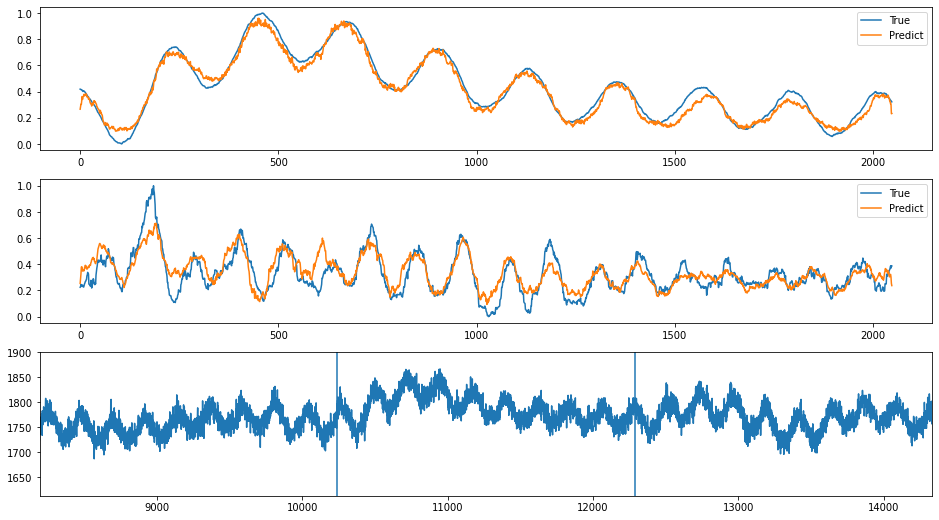

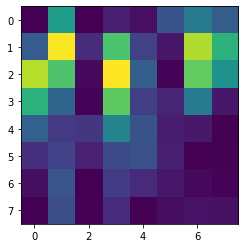

index: 166625
Error: 0.004840926842853469
type                                                         Inst
fill                                                         6603
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-04-23 19:41:08
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6603/...
n_bunches                                                      12
bunch_index                                                     4
bunch_number                                                    4
ts_length                                                   65536
chunk                                                          22
Name: 5752, dtype: object


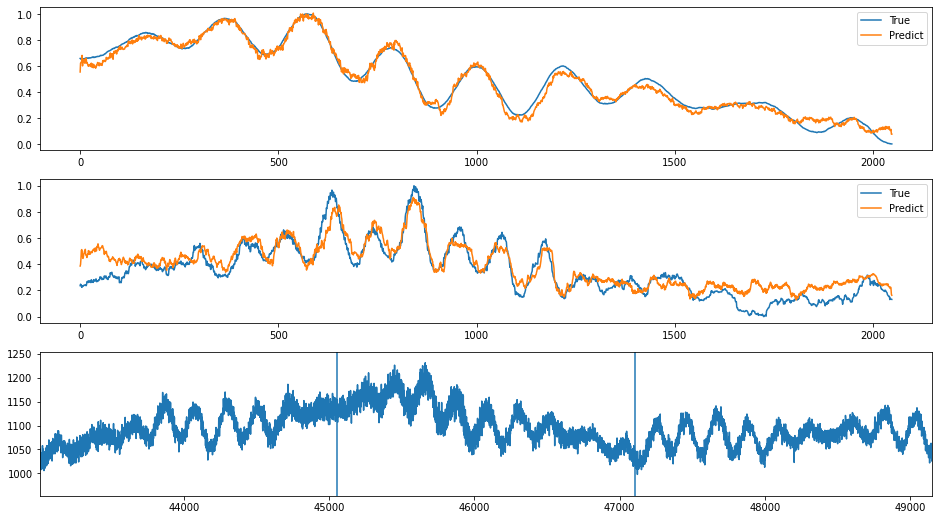

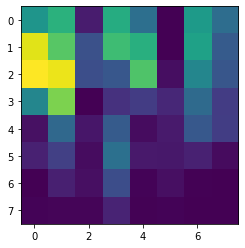

index: 76973
Error: 0.004856772115041247
type                                                         Inst
fill                                                         7122
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-03 07:32:49
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7122/...
n_bunches                                                     780
bunch_index                                                   969
bunch_number                                                  698
ts_length                                                   65536
chunk                                                          28
Name: 7302, dtype: object


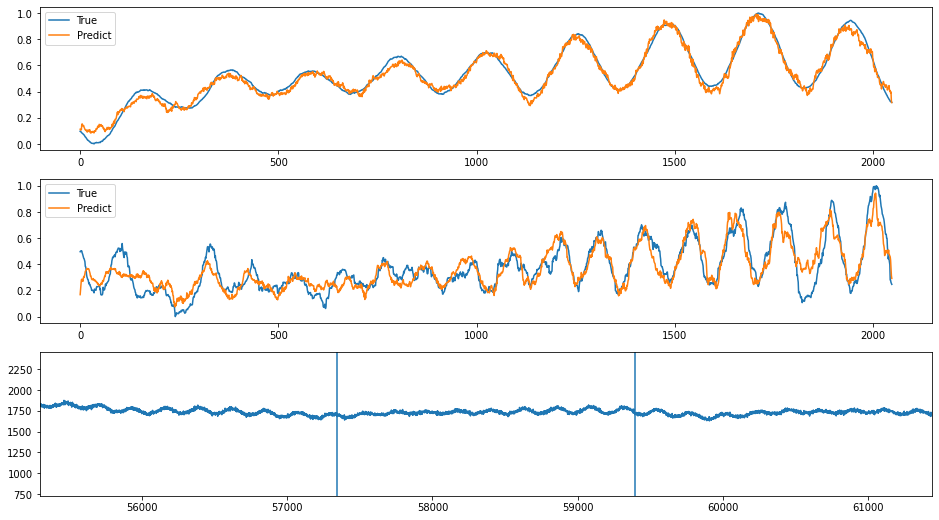

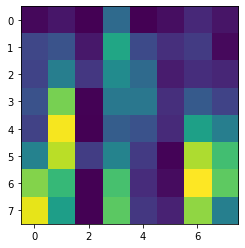

index: 134510
Error: 0.004863040115059237
type                                                         Inst
fill                                                         7128
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-06 03:09:54
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7128/...
n_bunches                                                     396
bunch_index                                                   242
bunch_number                                                  155
ts_length                                                   65536
chunk                                                          12
Name: 3137, dtype: object


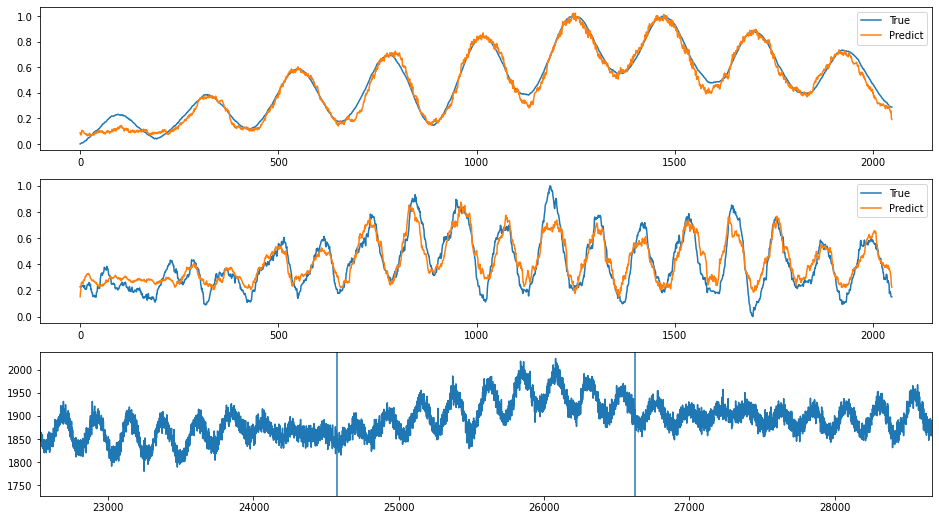

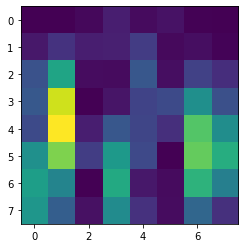

index: 310919
Error: 0.004865168314863067
type                                                         Inst
fill                                                         6961
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-22 19:27:46
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6961/...
n_bunches                                                     636
bunch_index                                                   327
bunch_number                                                  226
ts_length                                                   65536
chunk                                                          27
Name: 7146, dtype: object


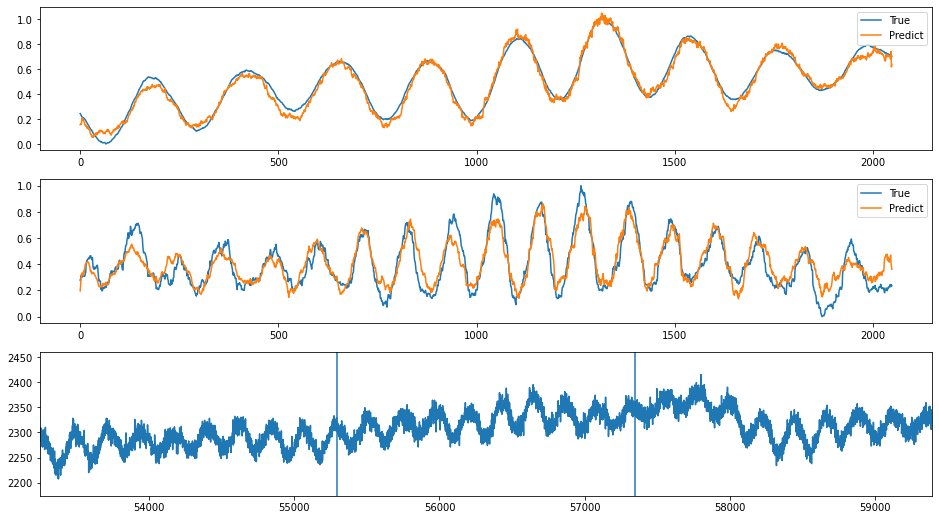

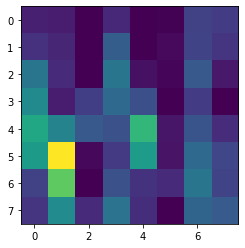

index: 214169
Error: 0.004903675254796248
type                                                         Inst
fill                                                         6929
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-16 03:29:36
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6929/...
n_bunches                                                     843
bunch_index                                                  1170
bunch_number                                                  358
ts_length                                                   65536
chunk                                                          16
Name: 4197, dtype: object


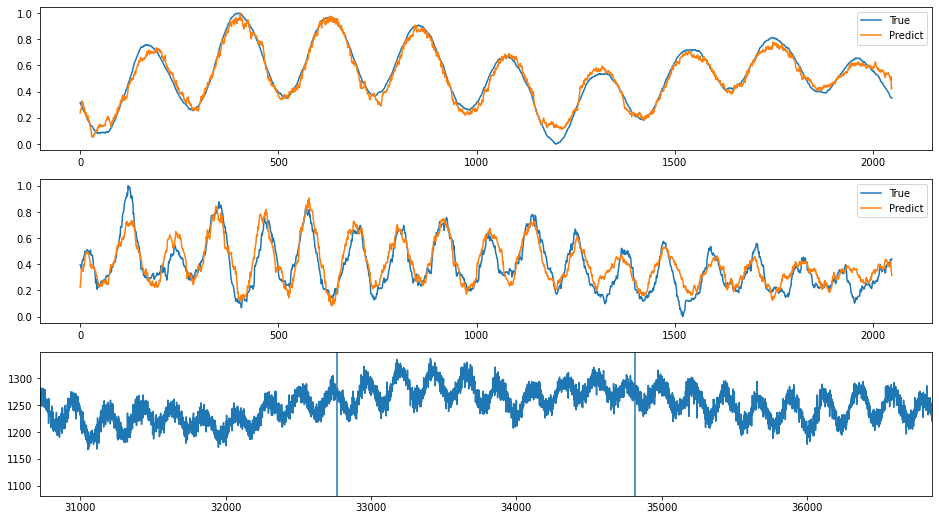

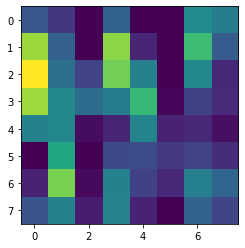

In [25]:
for i in range(10):
    index = sorted_error_indices[i]
    plot_train_index(index)

# From right to left

index: 204293
Error: 0.05191537978863213
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                           8
Name: 2091, dtype: object


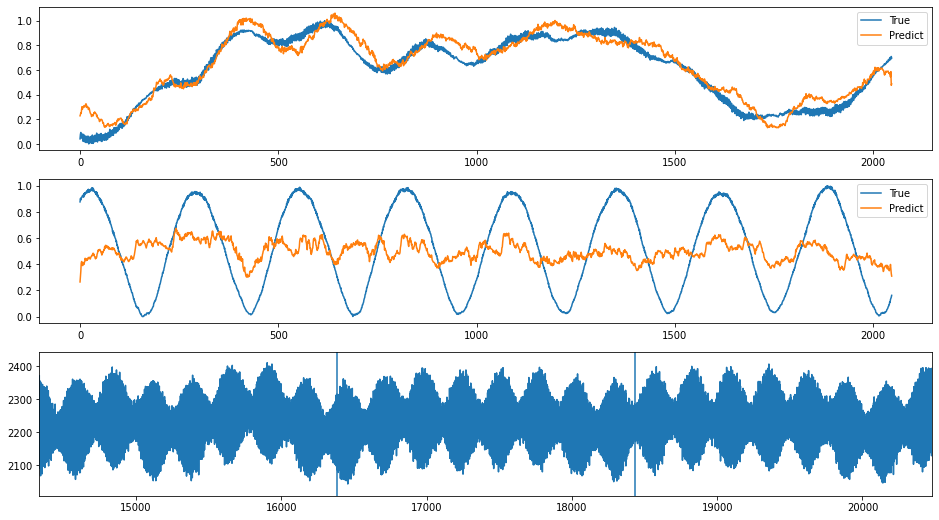

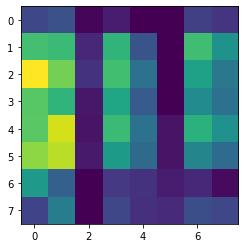

index: 202740
Error: 0.04962231078644674
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          17
Name: 4397, dtype: object


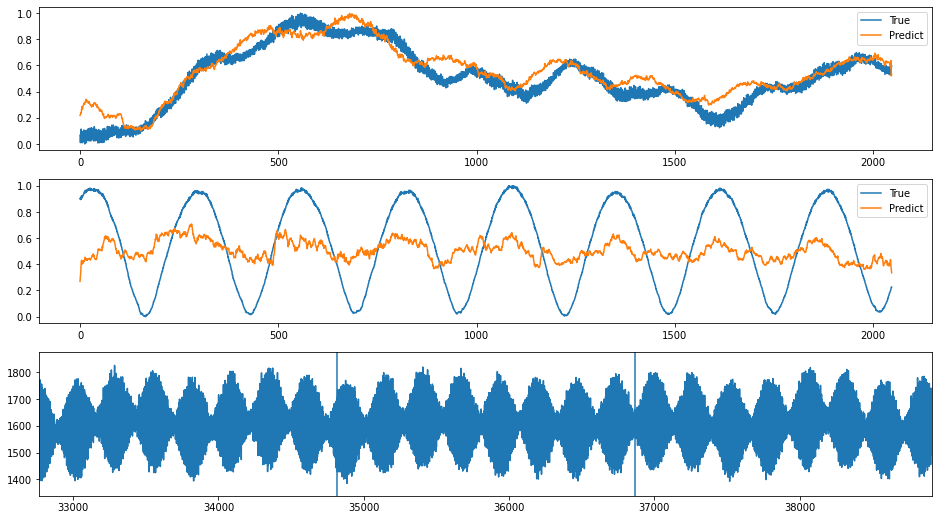

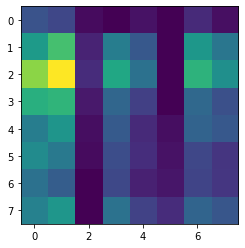

index: 151098
Error: 0.048786670926161374
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:32:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   109
bunch_number                                                   10
ts_length                                                   65536
chunk                                                          15
Name: 4090, dtype: object


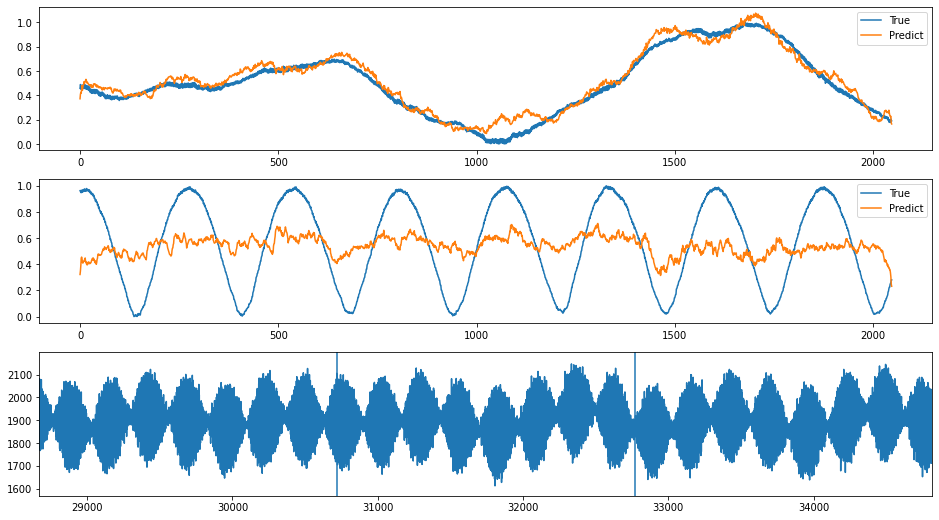

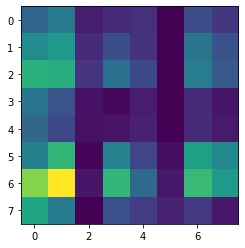

index: 203573
Error: 0.048755784201395175
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          19
Name: 4907, dtype: object


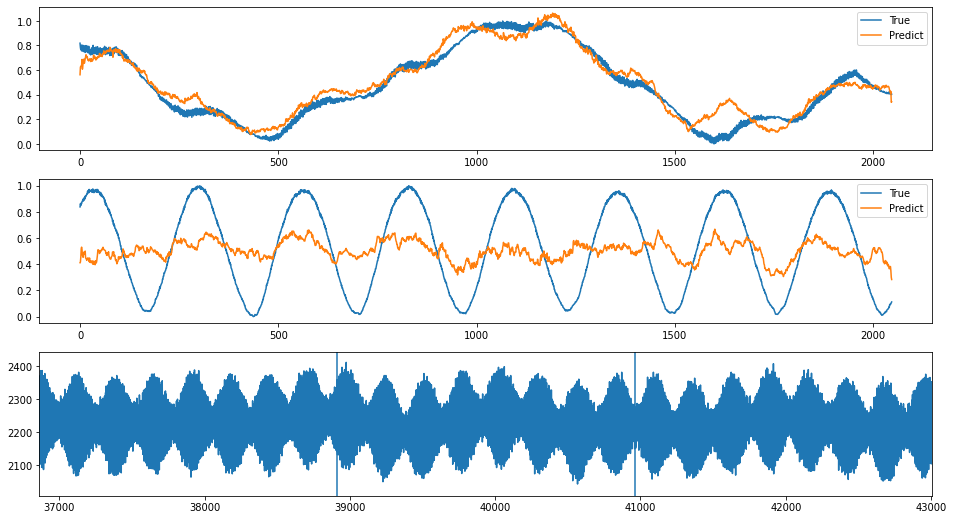

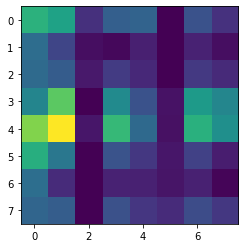

index: 201964
Error: 0.048599825813011754
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                           5
Name: 1325, dtype: object


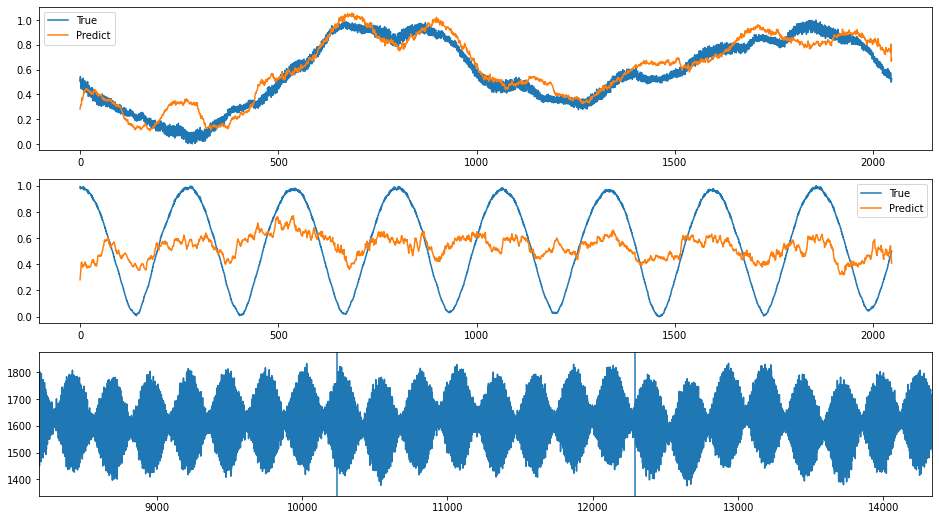

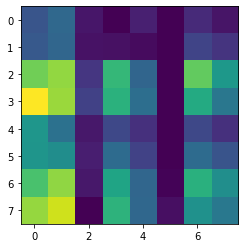

index: 202125
Error: 0.04855264679442832
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          13
Name: 3373, dtype: object


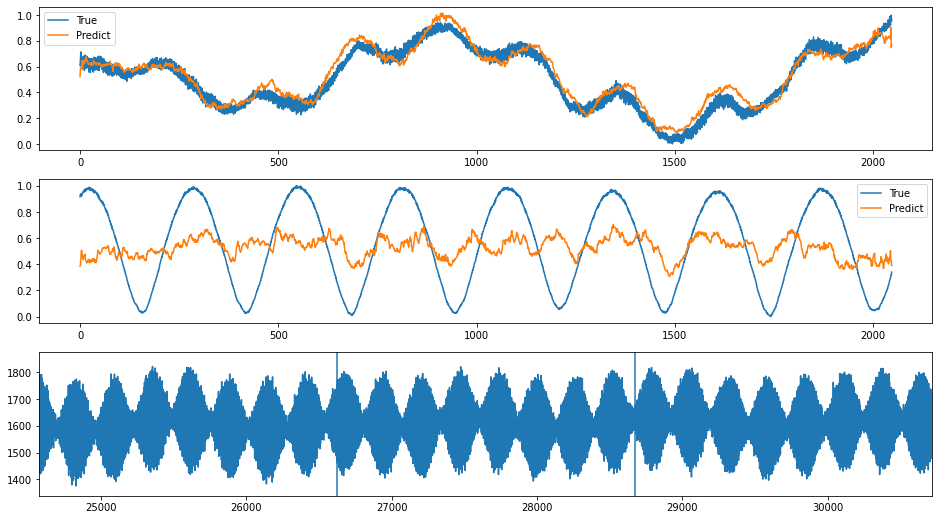

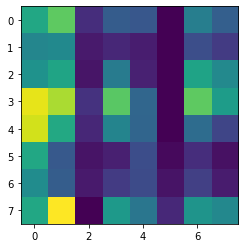

index: 204393
Error: 0.04821980251133
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                           1
Name: 299, dtype: object


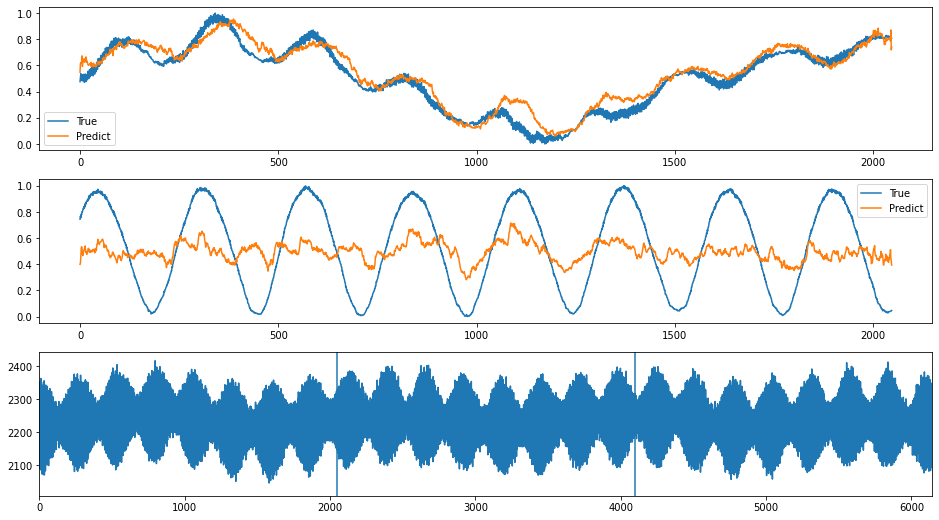

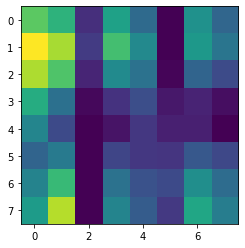

index: 198583
Error: 0.04819587822650758
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          12
Name: 3115, dtype: object


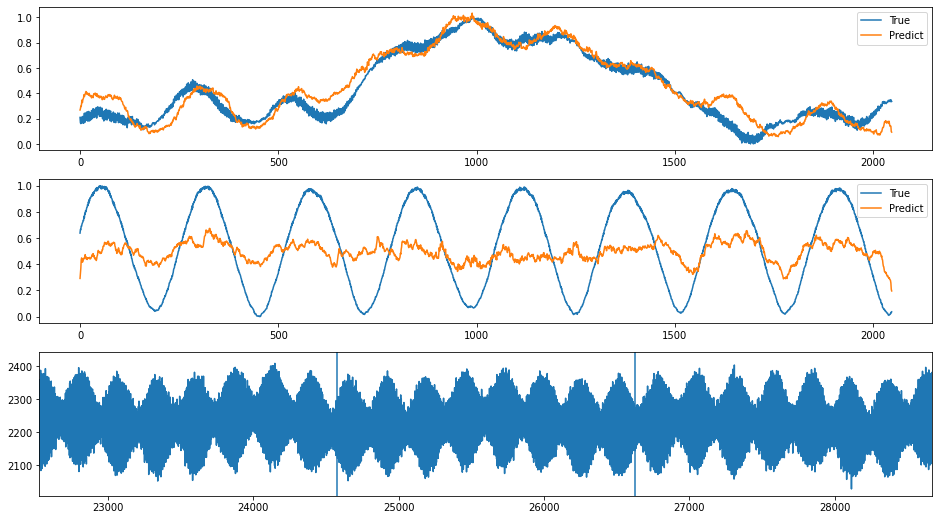

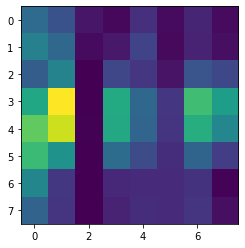

index: 205494
Error: 0.04813043873339644
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          25
Name: 6445, dtype: object


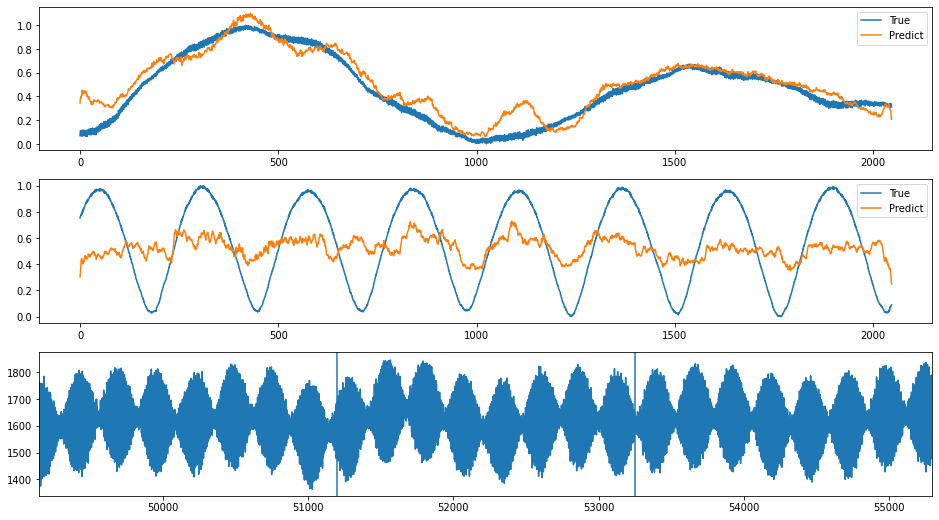

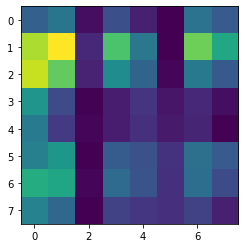

index: 164753
Error: 0.047779700749330196
type                                                         Inst
fill                                                         6201
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-15 02:14:35
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6201/...
n_bunches                                                     205
bunch_index                                                    95
bunch_number                                                   27
ts_length                                                   65536
chunk                                                           5
Name: 1314, dtype: object


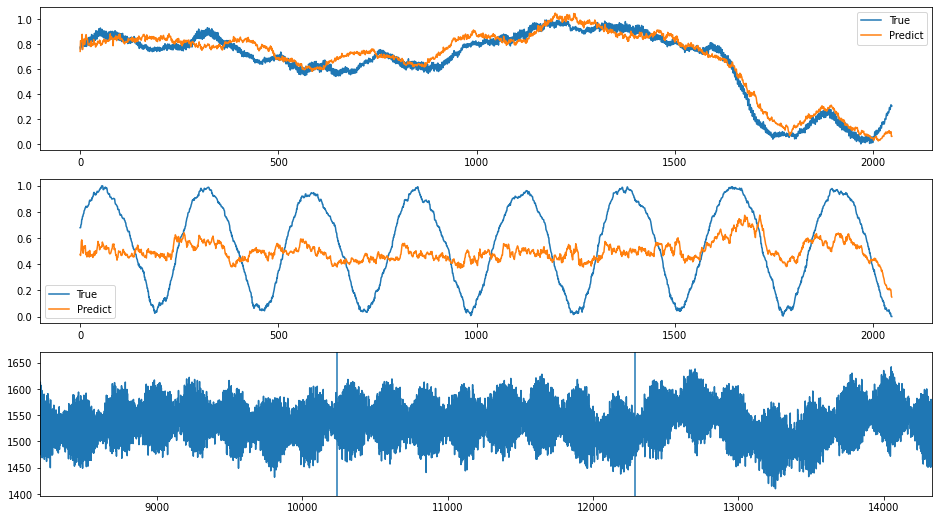

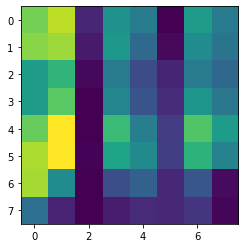

index: 156142
Error: 0.04777135567707839
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:32:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   109
bunch_number                                                   10
ts_length                                                   65536
chunk                                                           3
Name: 1018, dtype: object


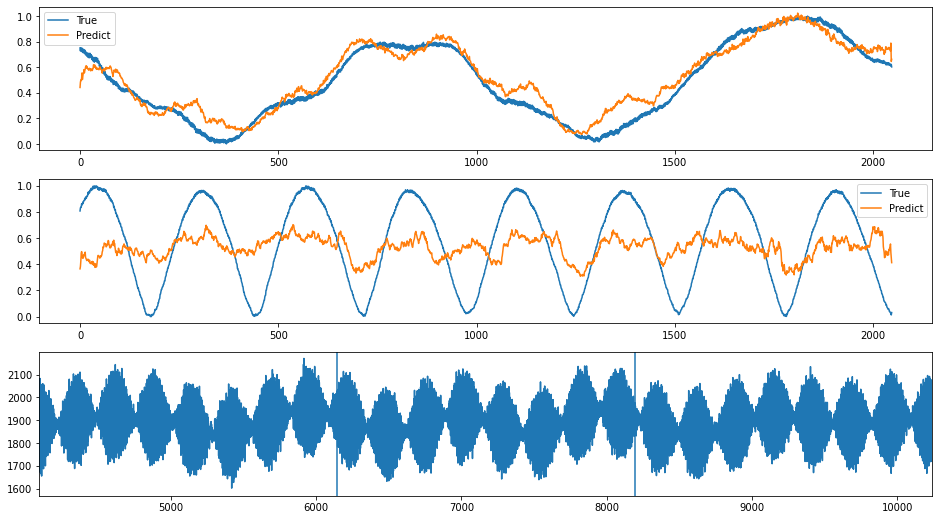

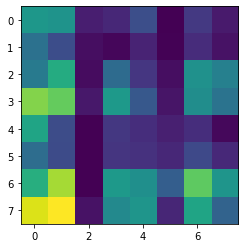

index: 199515
Error: 0.04775505563308041
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                           9
Name: 2349, dtype: object


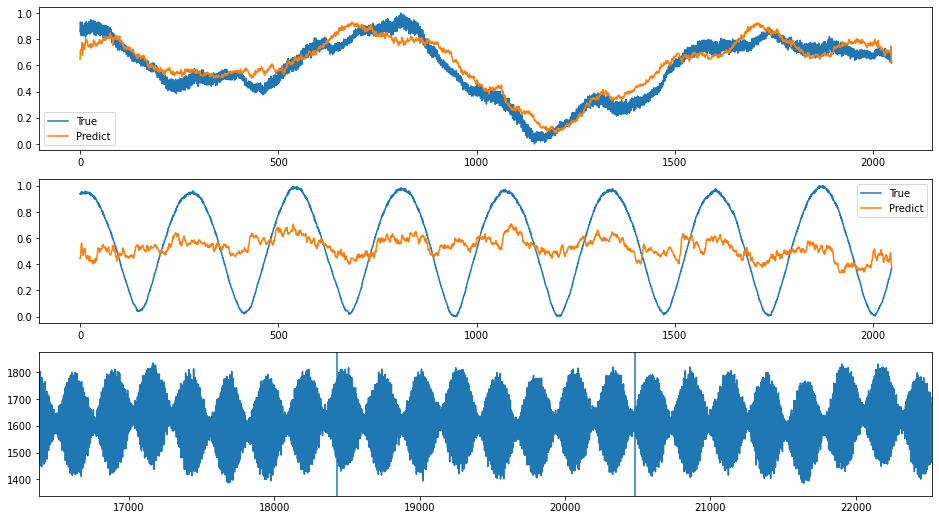

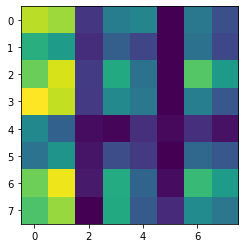

index: 371422
Error: 0.0472180809633653
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:54:56
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                   551
bunch_number                                                   54
ts_length                                                   65536
chunk                                                           0
Name: 111, dtype: object


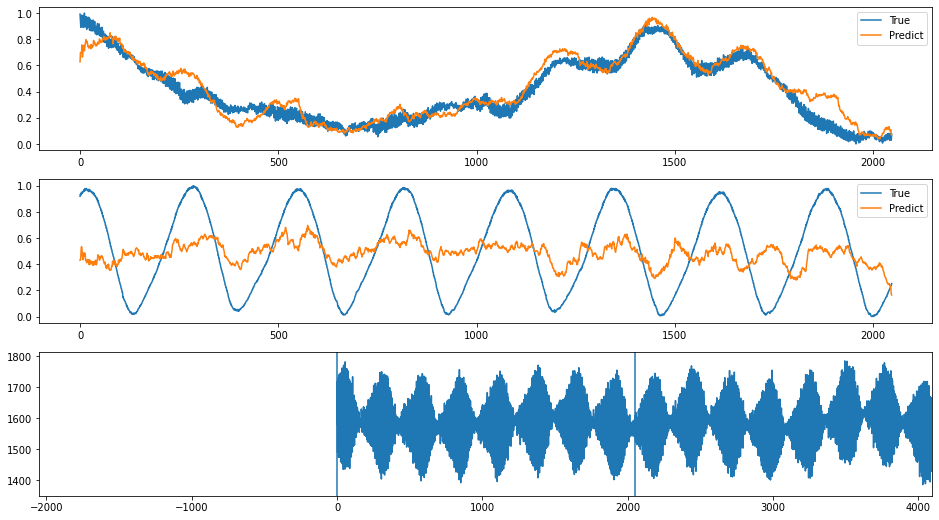

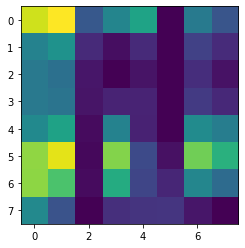

index: 199794
Error: 0.04712611241325447
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          26
Name: 6699, dtype: object


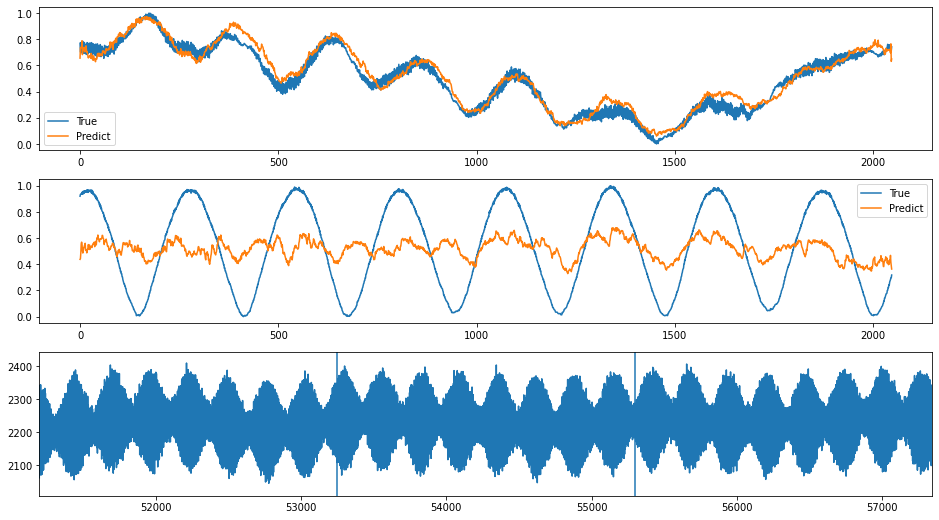

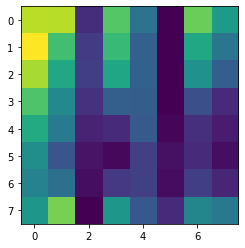

index: 157231
Error: 0.04711683968169776
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:32:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   109
bunch_number                                                   10
ts_length                                                   65536
chunk                                                          12
Name: 3322, dtype: object


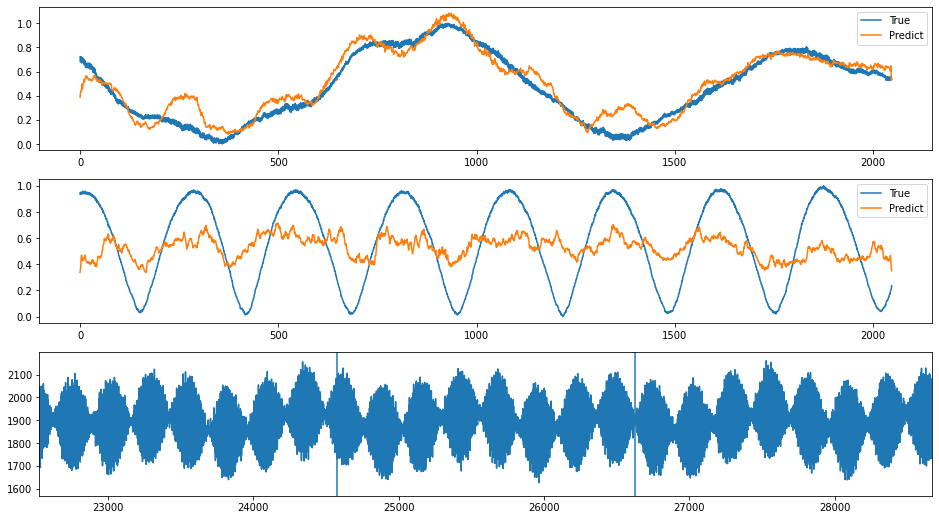

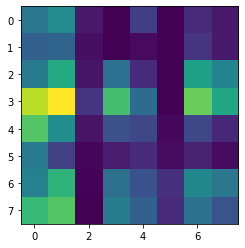

index: 202211
Error: 0.04659506288281961
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          21
Name: 5419, dtype: object


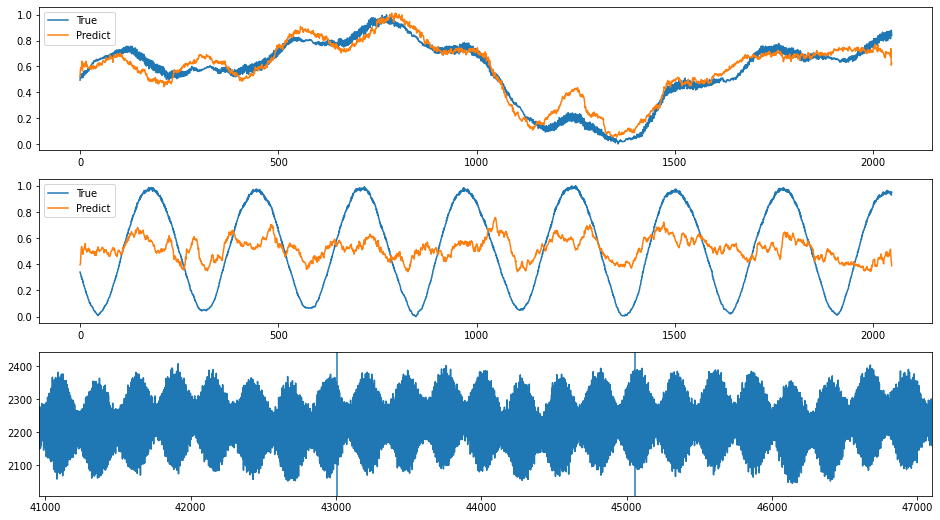

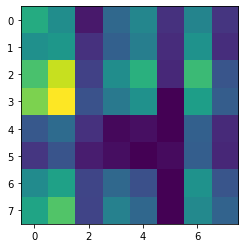

index: 308249
Error: 0.046514435848543485
type                                                         Inst
fill                                                         6192
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-12 17:15:33
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6192/...
n_bunches                                                     460
bunch_index                                                   787
bunch_number                                                  425
ts_length                                                   65536
chunk                                                           6
Name: 1657, dtype: object


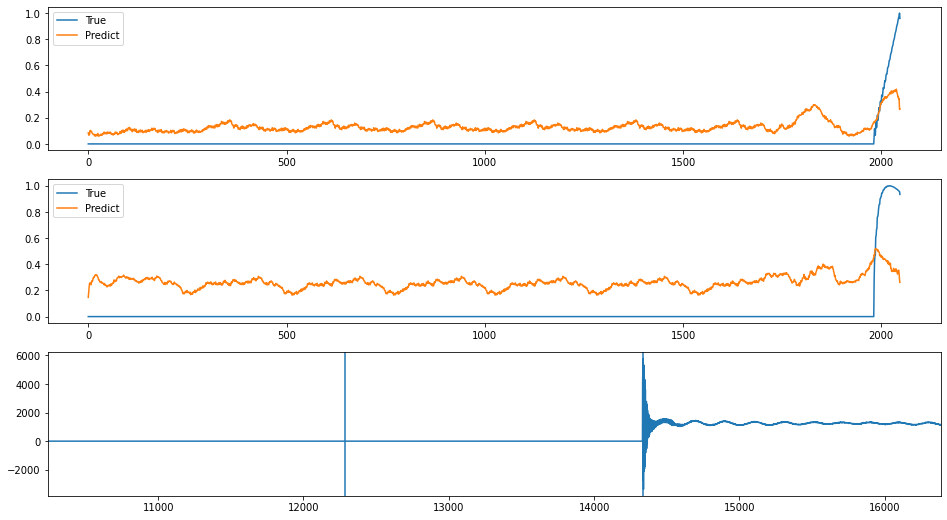

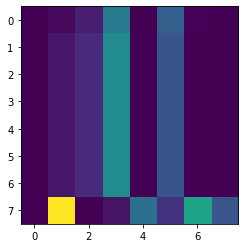

index: 201900
Error: 0.04637247367347096
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                           1
Name: 301, dtype: object


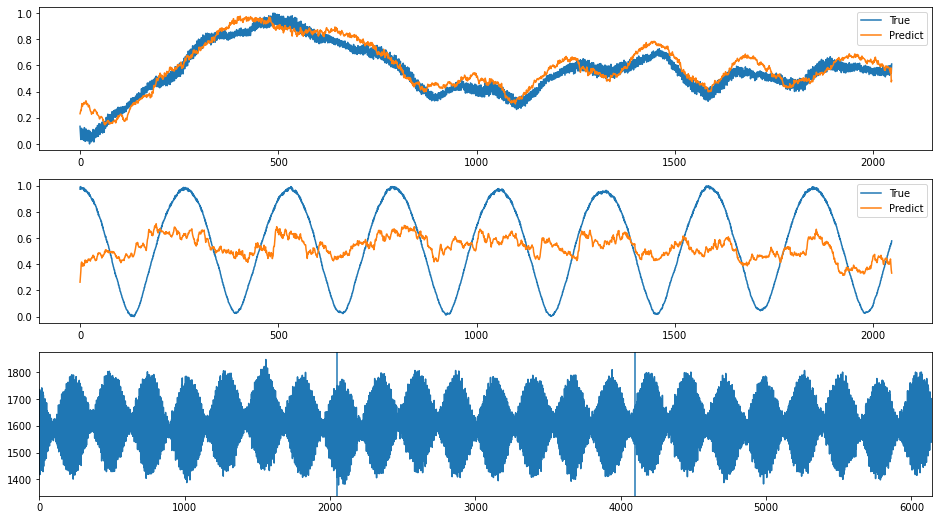

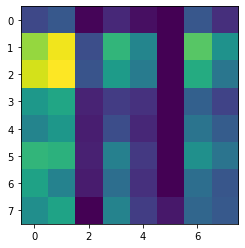

index: 158377
Error: 0.046338816089077216
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:32:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   109
bunch_number                                                   10
ts_length                                                   65536
chunk                                                           6
Name: 1786, dtype: object


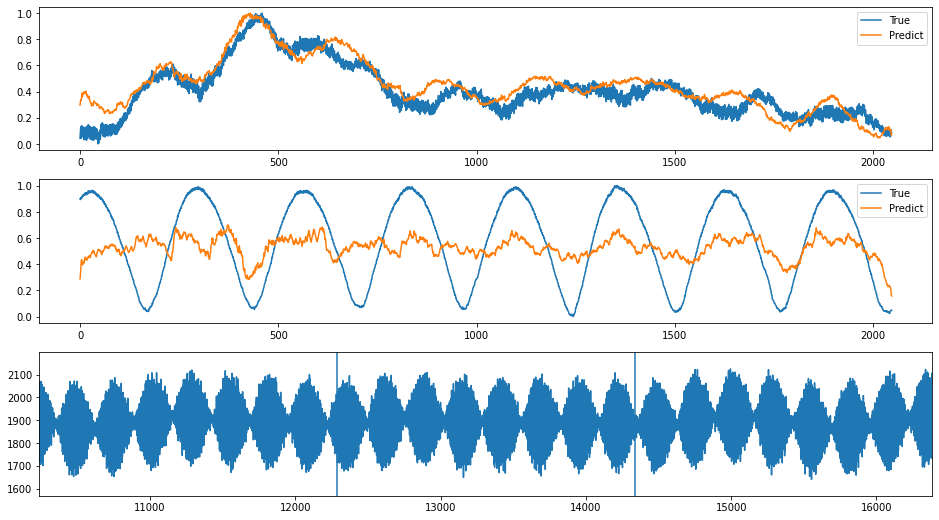

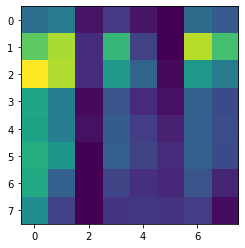

index: 156411
Error: 0.04619391104393866
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:32:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   109
bunch_number                                                   10
ts_length                                                   65536
chunk                                                           9
Name: 2554, dtype: object


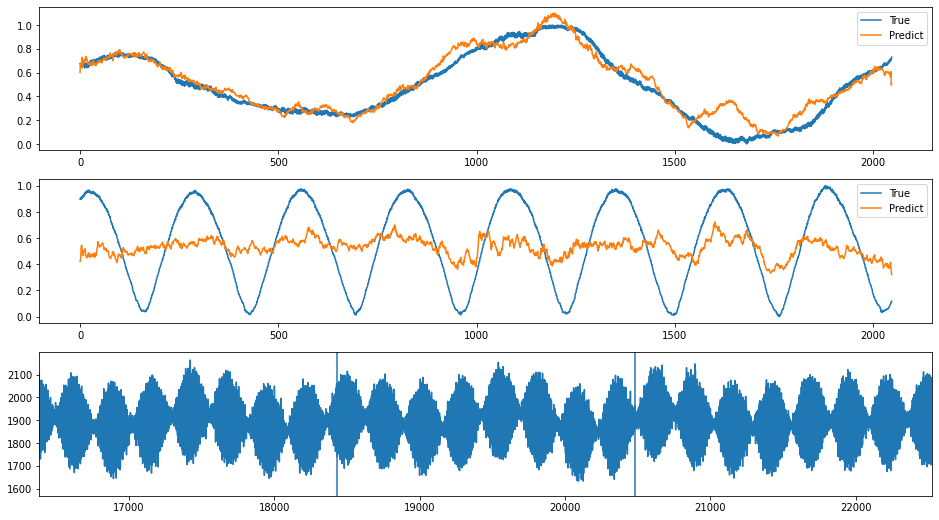

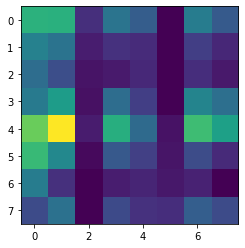

index: 206327
Error: 0.04617037278479074
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          29
Name: 7469, dtype: object


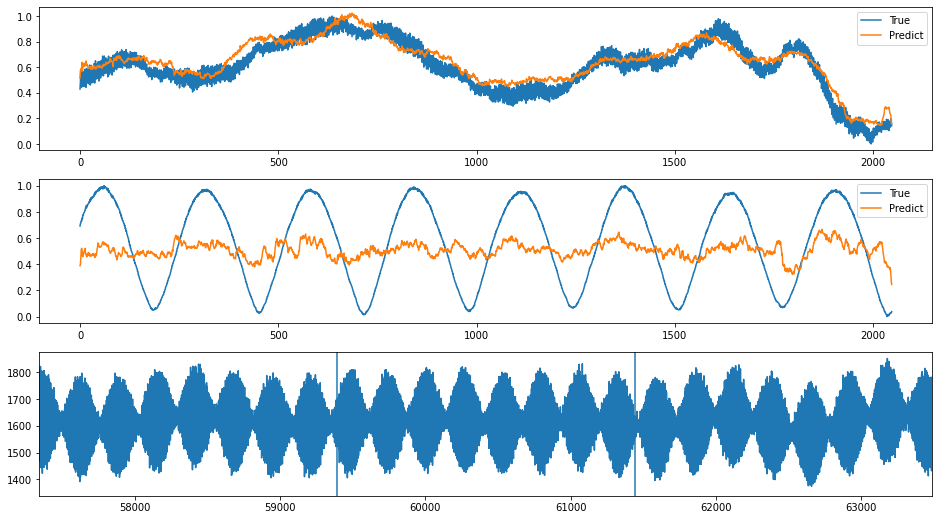

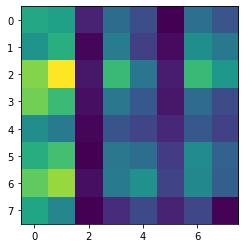

index: 204466
Error: 0.04605692536158153
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          17
Name: 4395, dtype: object


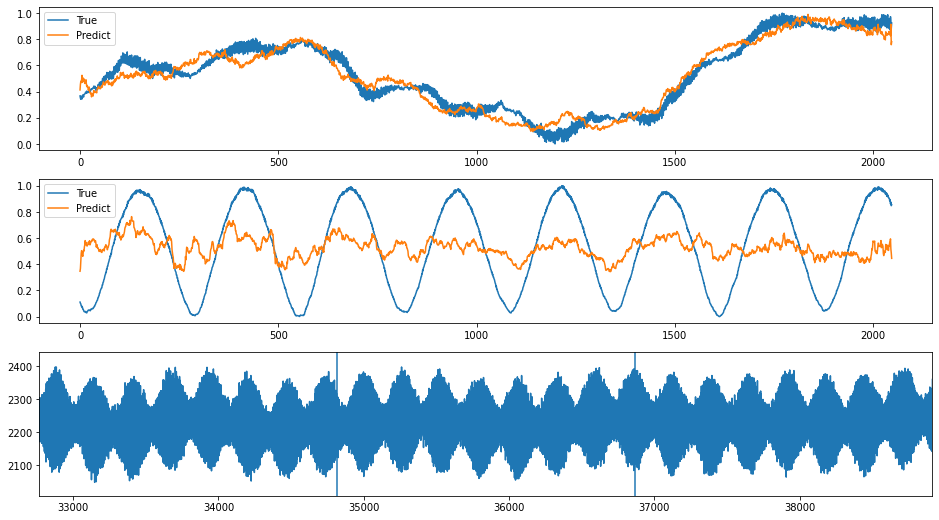

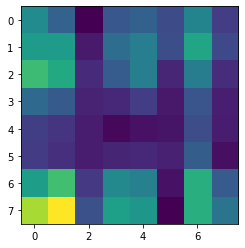

index: 205090
Error: 0.04602723426431195
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          18
Name: 4651, dtype: object


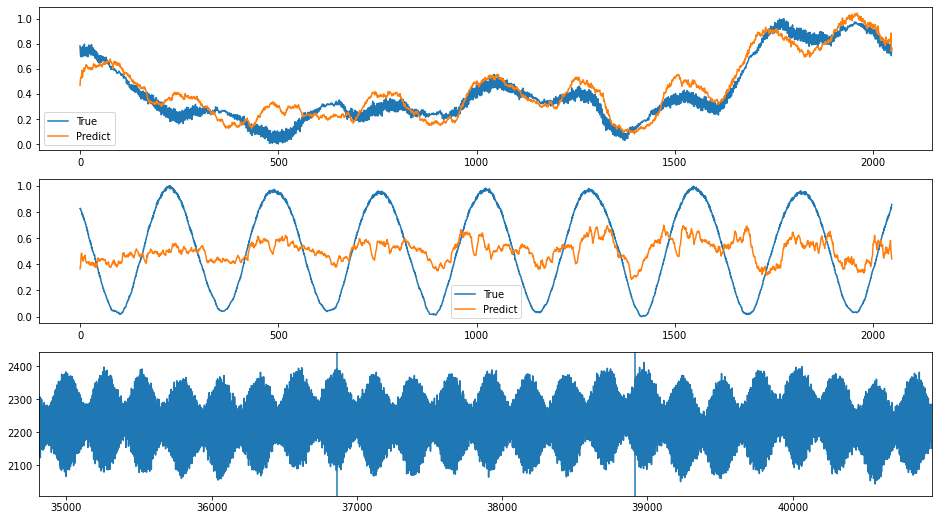

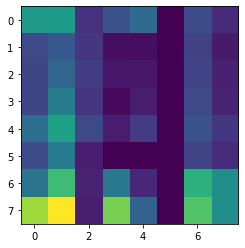

index: 201907
Error: 0.045752501018383934
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          27
Name: 6957, dtype: object


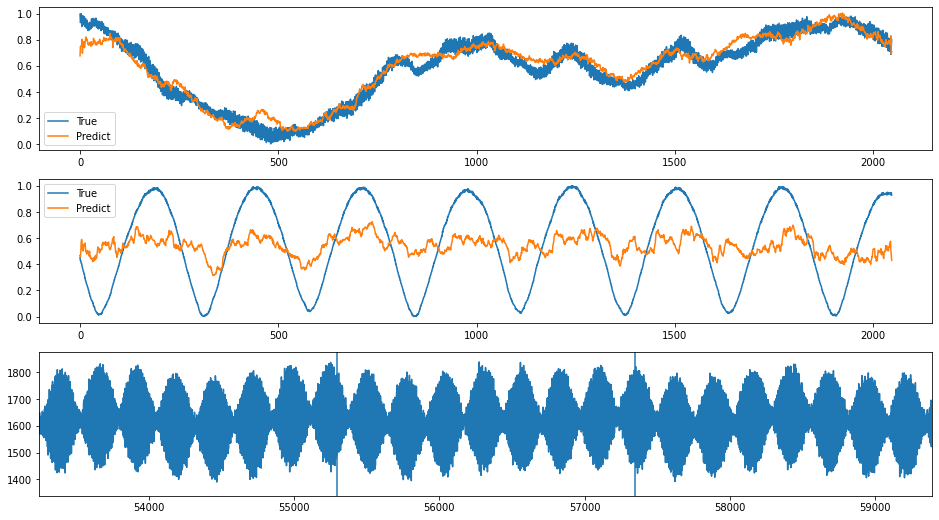

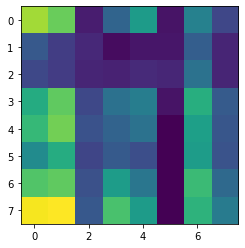

index: 198909
Error: 0.04572045259285376
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          15
Name: 3883, dtype: object


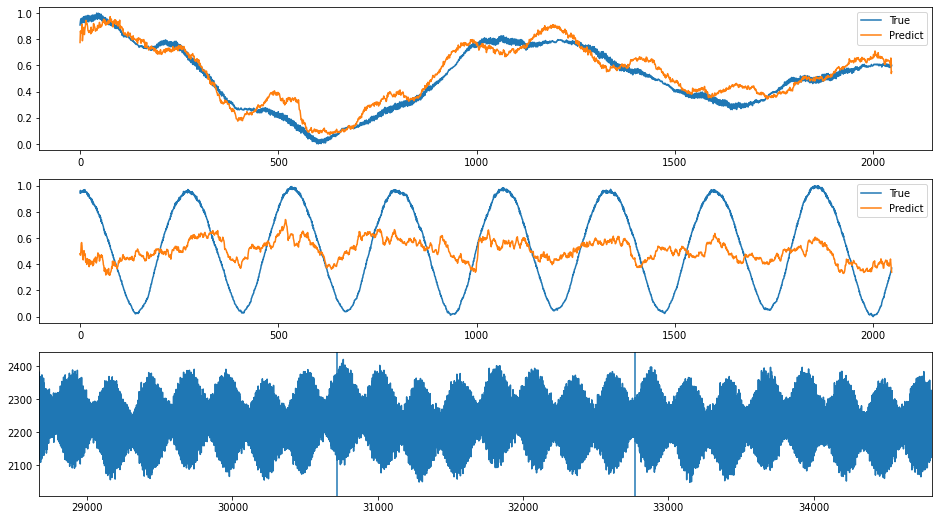

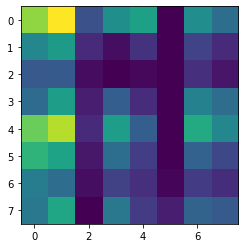

index: 202799
Error: 0.04564426614689801
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          28
Name: 7213, dtype: object


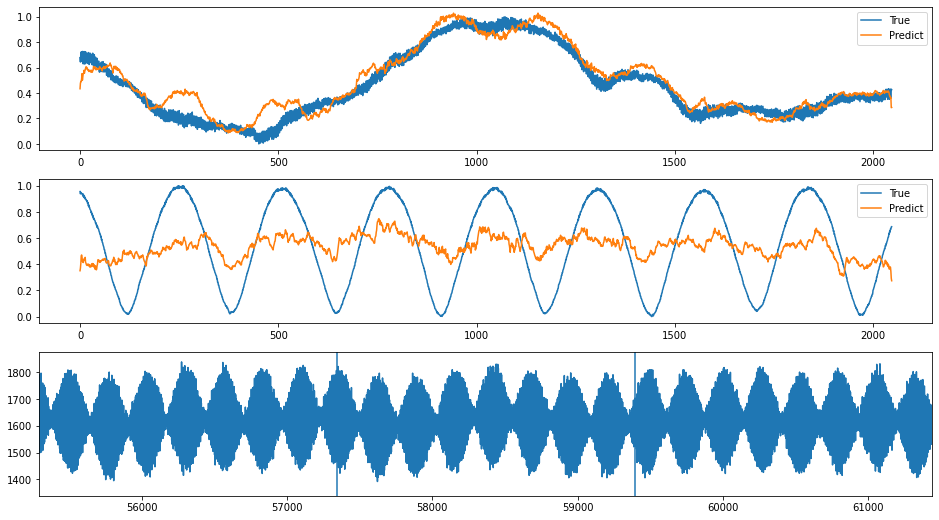

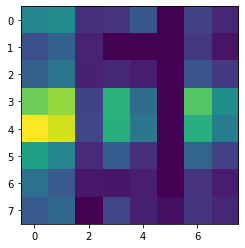

index: 151258
Error: 0.04561530649320247
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:32:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   109
bunch_number                                                   10
ts_length                                                   65536
chunk                                                           0
Name: 250, dtype: object


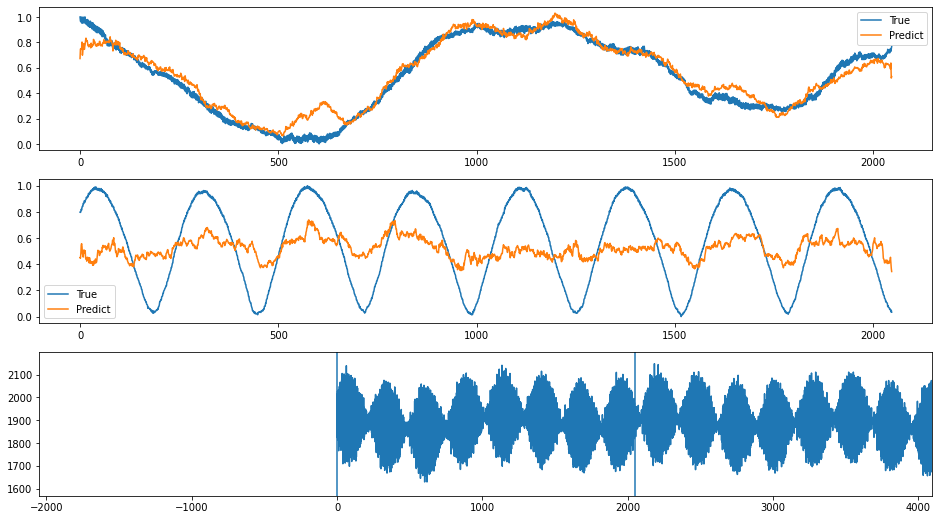

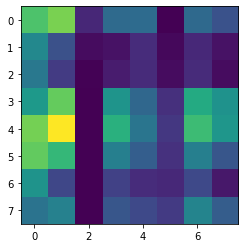

index: 202518
Error: 0.04542961150771601
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          29
Name: 7467, dtype: object


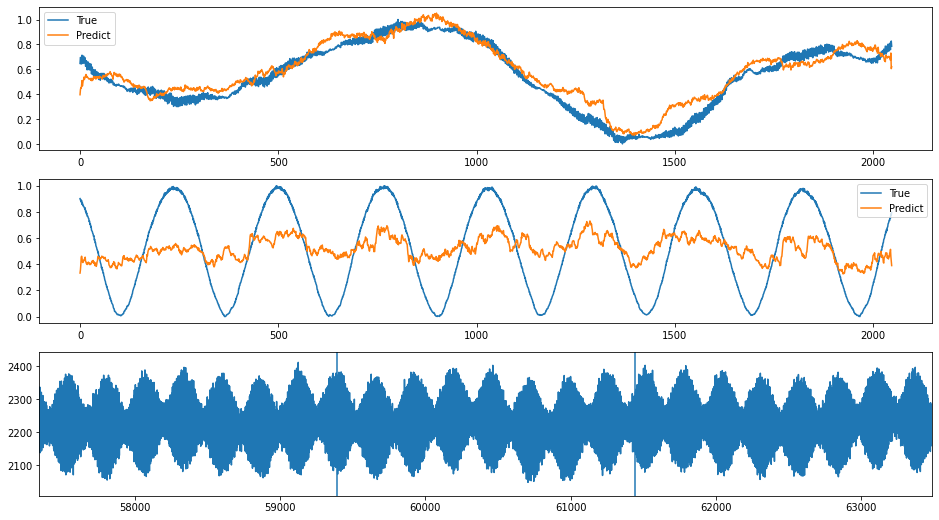

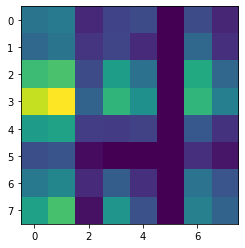

index: 204726
Error: 0.04537964300699389
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          11
Name: 2861, dtype: object


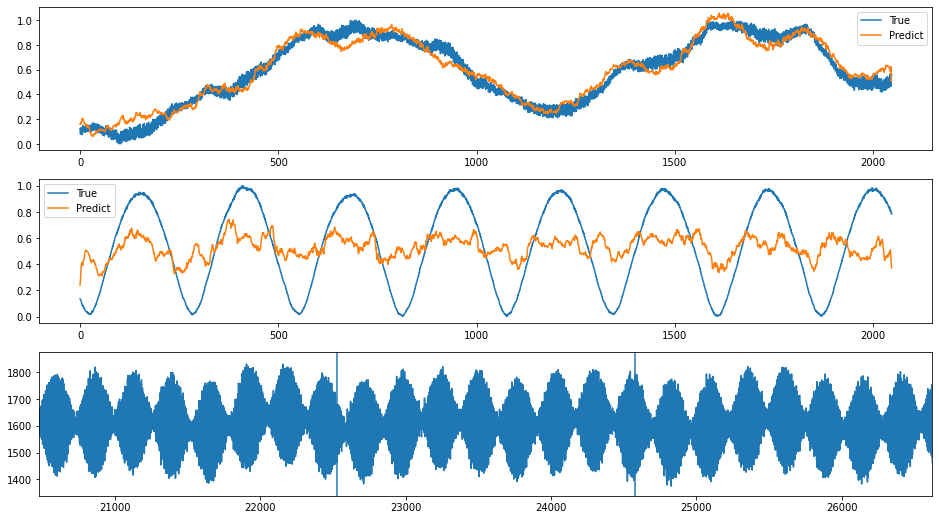

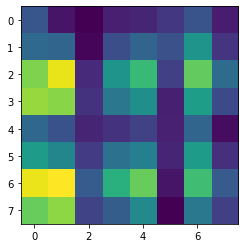

index: 365318
Error: 0.04529962886769246
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:54:56
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                   551
bunch_number                                                   54
ts_length                                                   65536
chunk                                                          30
Name: 7791, dtype: object


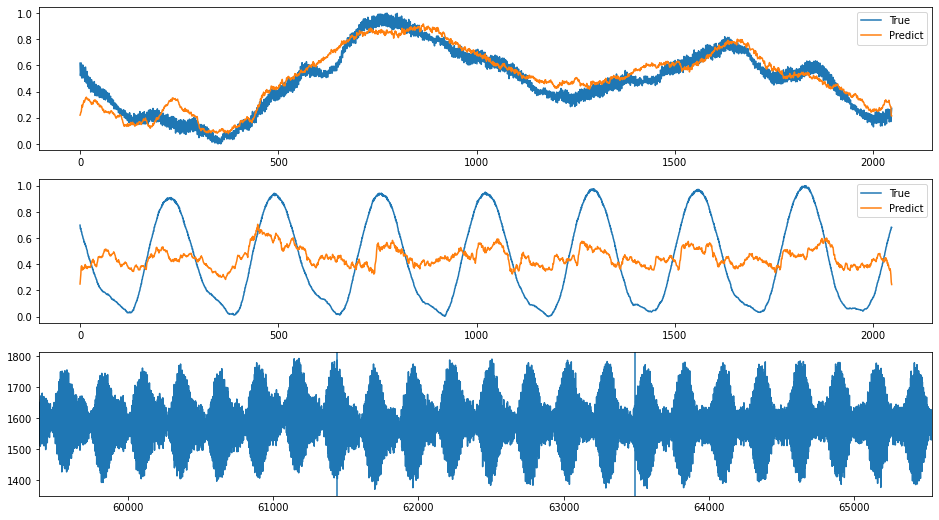

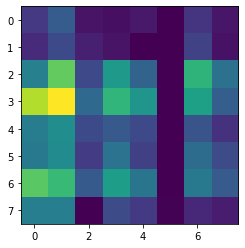

index: 203412
Error: 0.045246092133742026
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                           5
Name: 1323, dtype: object


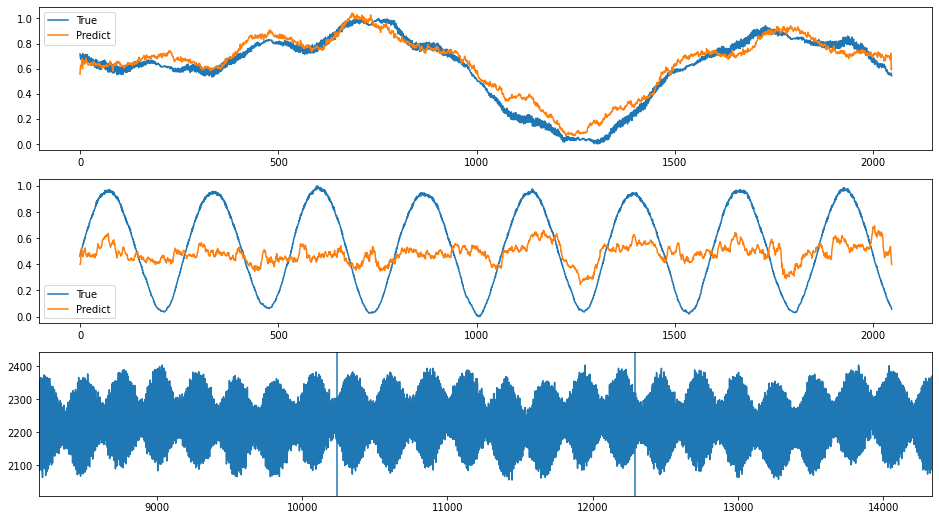

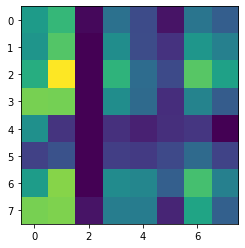

index: 377399
Error: 0.04515417298909922
type                                                         Inst
fill                                                         7382
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-29 01:53:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7382/...
n_bunches                                                     156
bunch_index                                                  1044
bunch_number                                                  142
ts_length                                                   65536
chunk                                                          23
Name: 6141, dtype: object


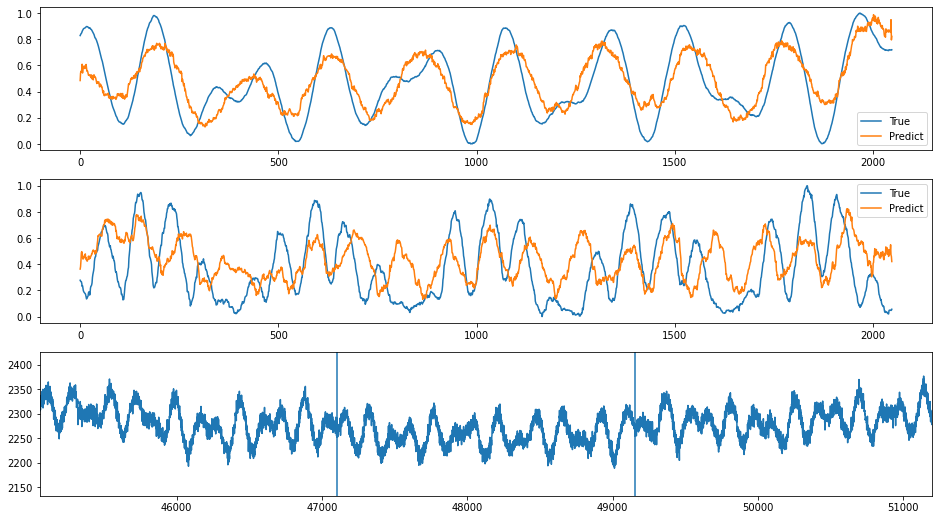

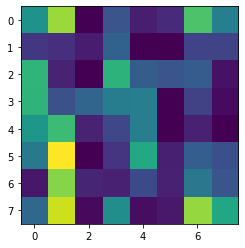

index: 204421
Error: 0.04512497732648532
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          24
Name: 6187, dtype: object


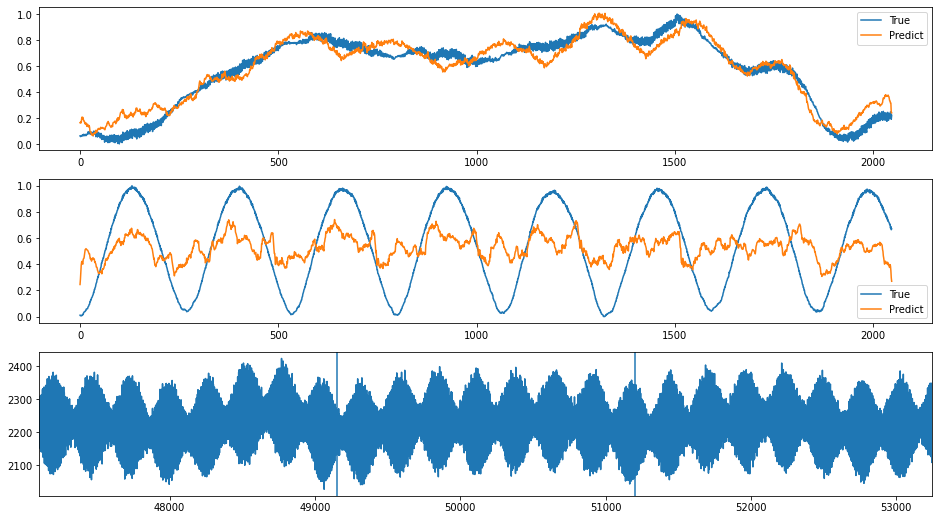

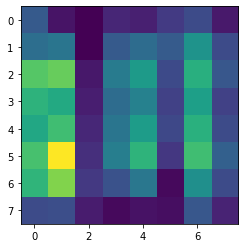

index: 204784
Error: 0.045039711925651704
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          10
Name: 2603, dtype: object


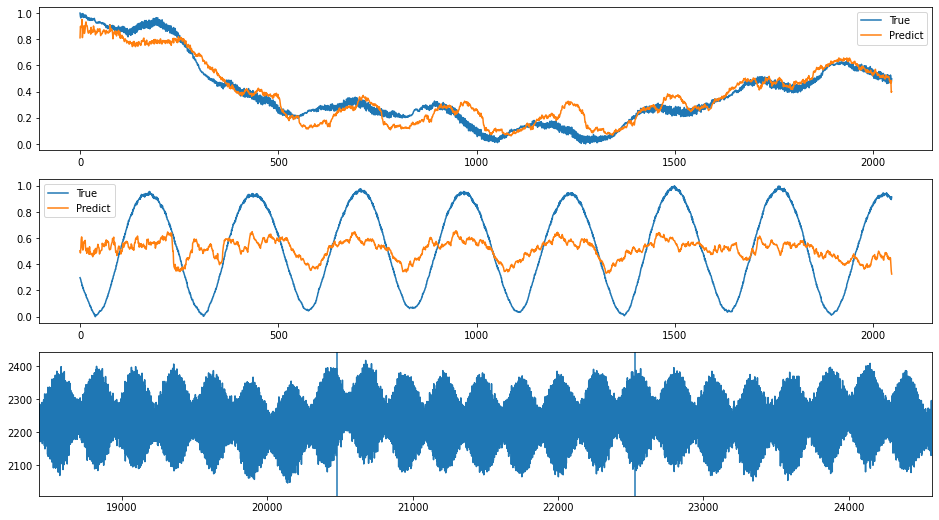

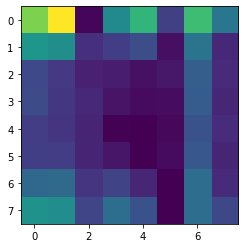

index: 198600
Error: 0.04502017649373781
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          21
Name: 5421, dtype: object


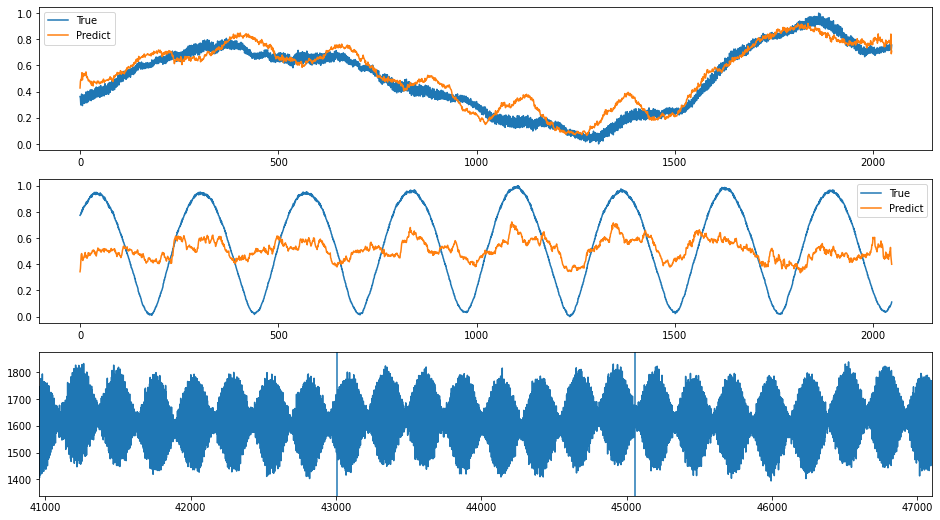

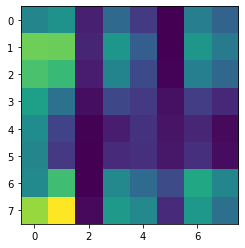

index: 156541
Error: 0.04498561184731808
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:32:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   109
bunch_number                                                   10
ts_length                                                   65536
chunk                                                          29
Name: 7674, dtype: object


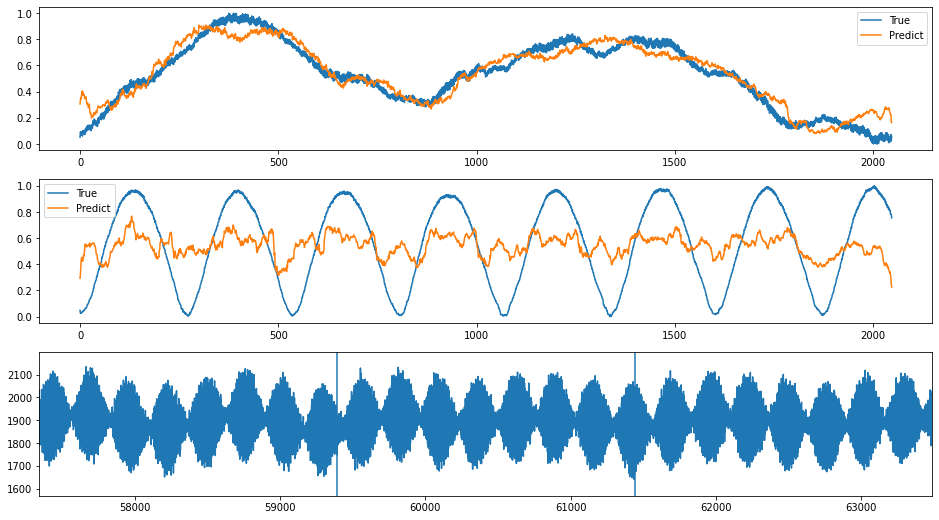

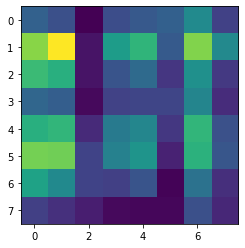

index: 202311
Error: 0.044714001973525576
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          30
Name: 7723, dtype: object


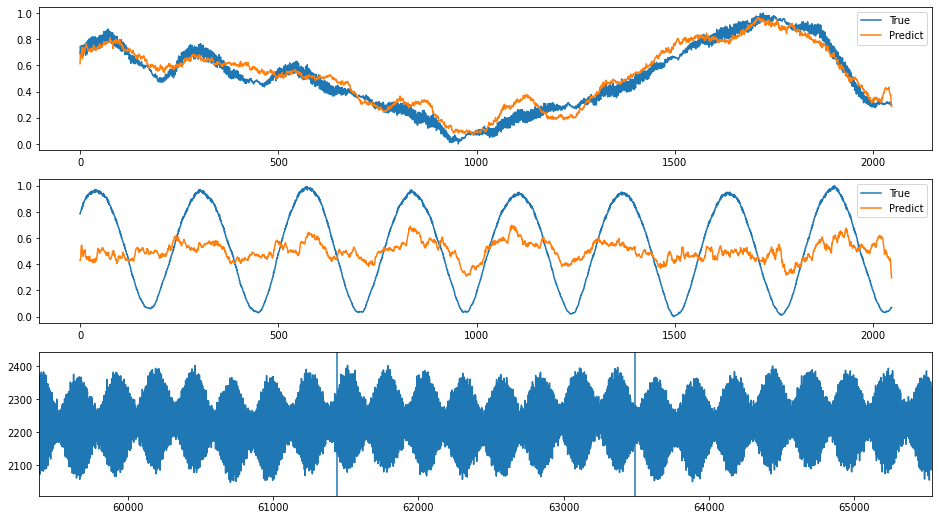

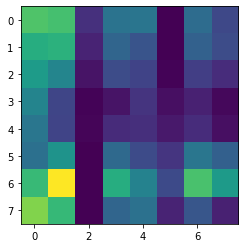

index: 202815
Error: 0.04465172279910068
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                           4
Name: 1067, dtype: object


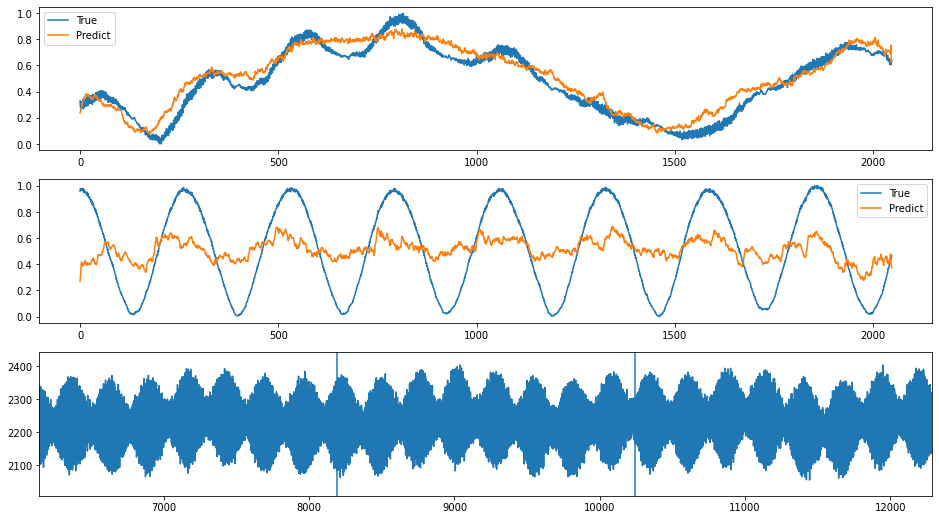

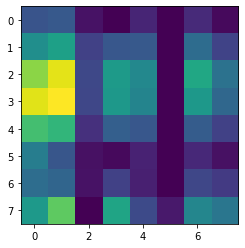

index: 163171
Error: 0.04461089174551316
type                                                         Inst
fill                                                         6201
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-15 02:14:35
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6201/...
n_bunches                                                     205
bunch_index                                                    95
bunch_number                                                   27
ts_length                                                   65536
chunk                                                           8
Name: 2082, dtype: object


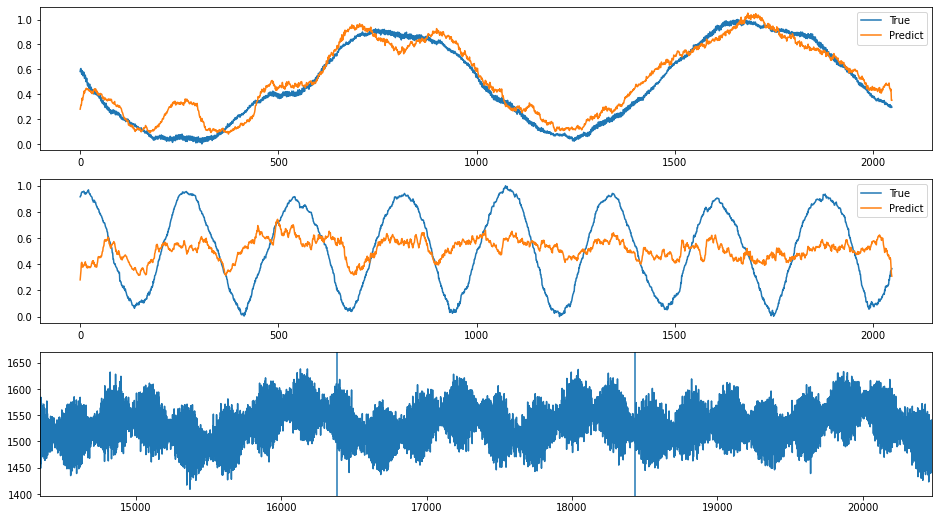

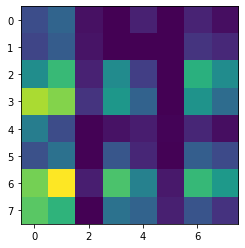

index: 153412
Error: 0.0445568703429752
type                                                         Inst
fill                                                         6217
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-17 10:32:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6217/...
n_bunches                                                      61
bunch_index                                                   109
bunch_number                                                   10
ts_length                                                   65536
chunk                                                          23
Name: 6138, dtype: object


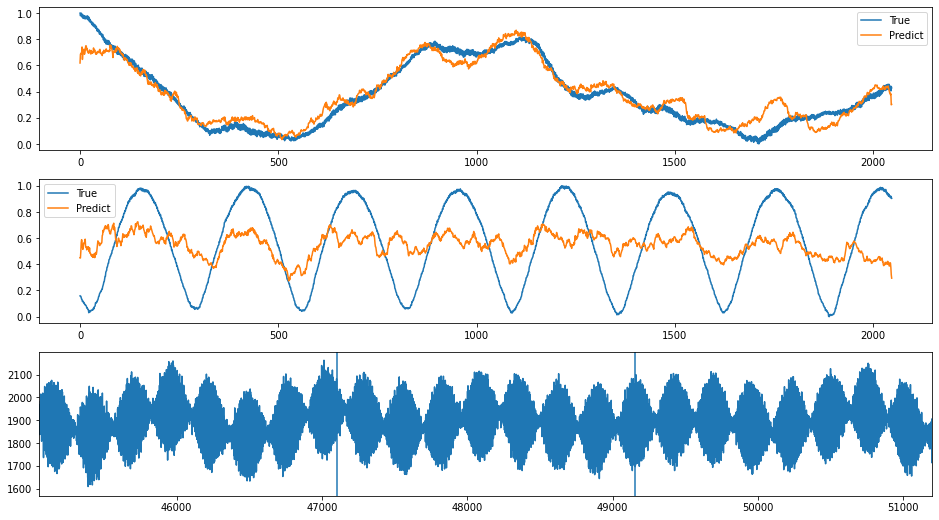

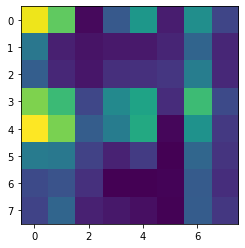

index: 203216
Error: 0.04440968764466391
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          13
Name: 3371, dtype: object


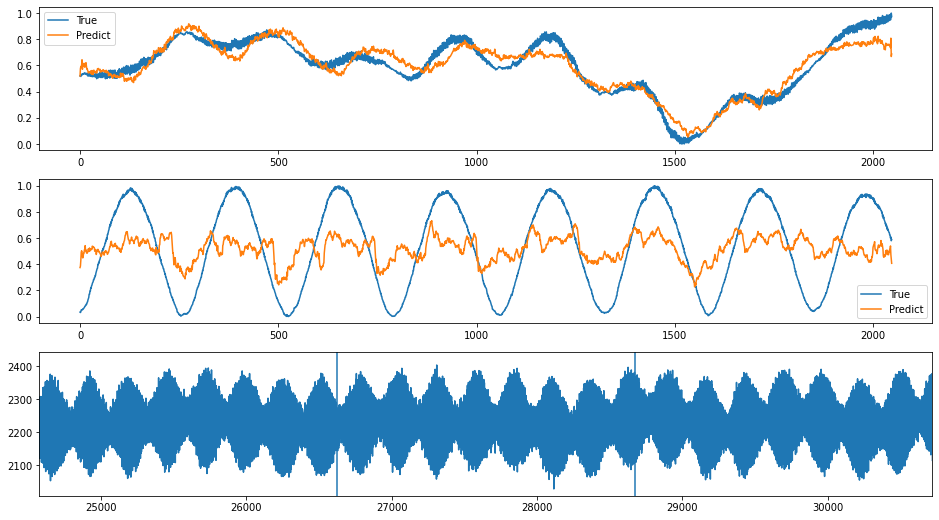

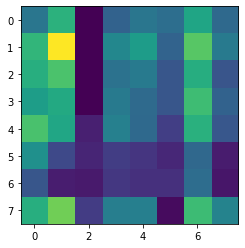

index: 205361
Error: 0.04438867943643805
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          19
Name: 4909, dtype: object


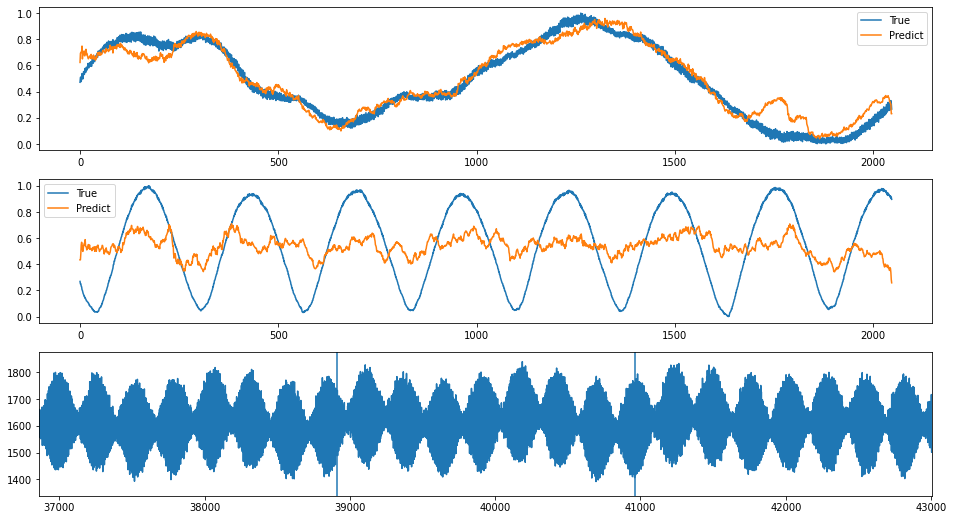

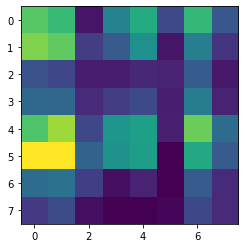

index: 200184
Error: 0.044342468471641985
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                           3
Name: 811, dtype: object


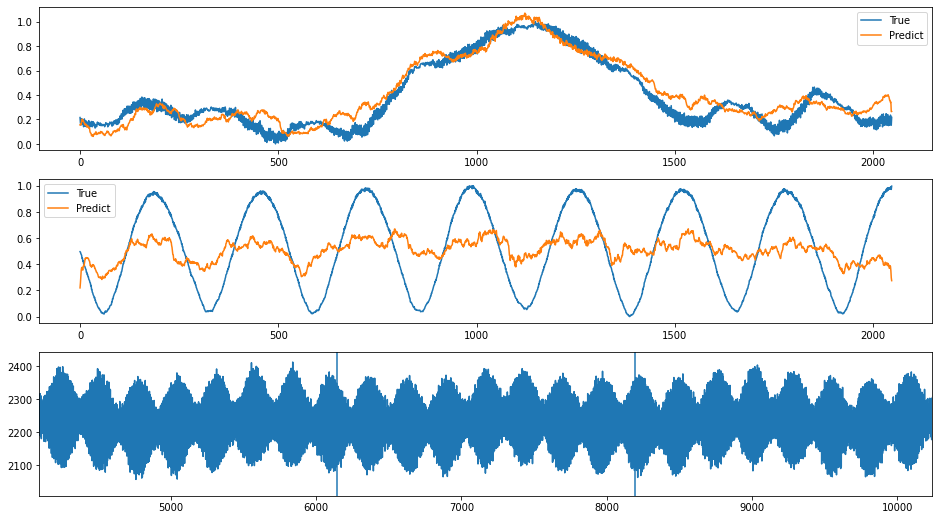

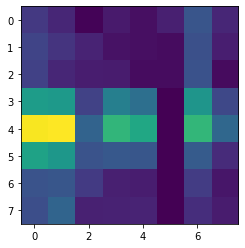

index: 204474
Error: 0.04426231987762868
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                          15
Name: 3885, dtype: object


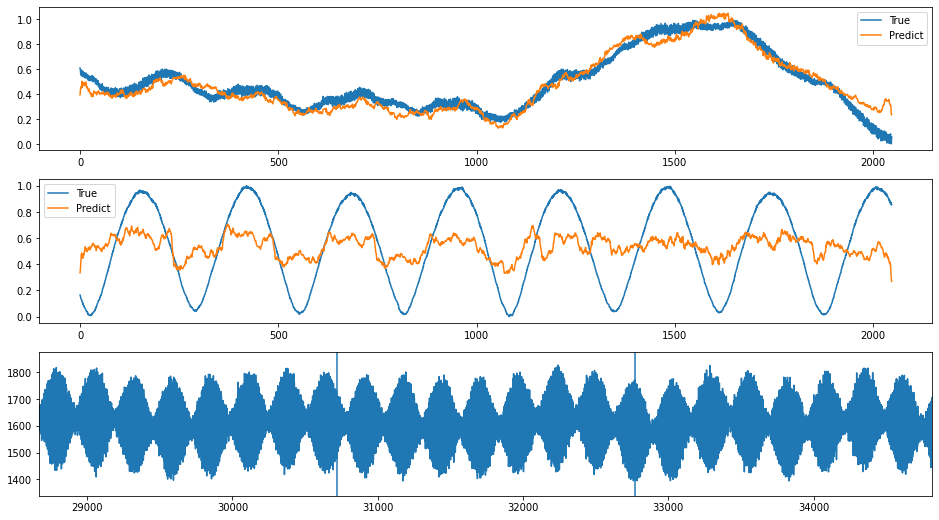

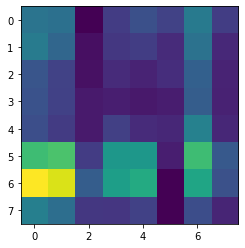

index: 205711
Error: 0.04425075857881648
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:53:06
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  2531
bunch_number                                                  120
ts_length                                                   65536
chunk                                                           8
Name: 2093, dtype: object


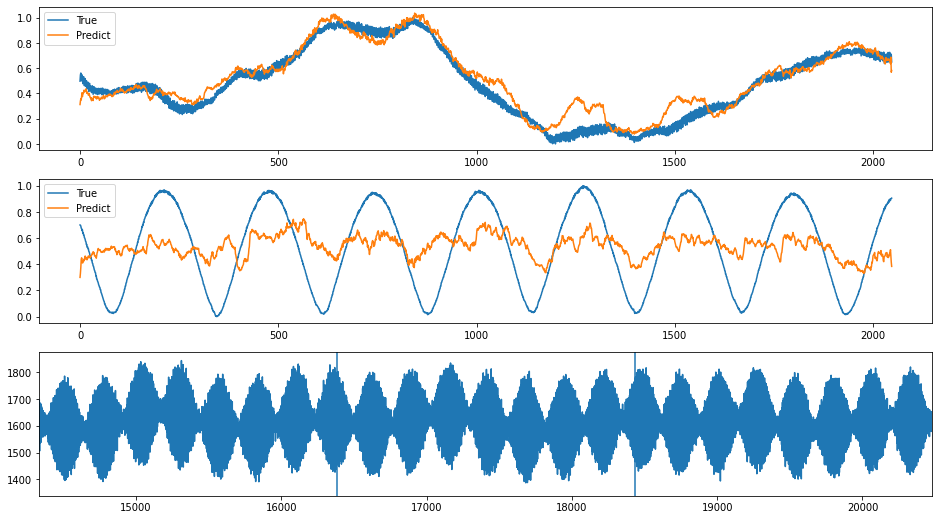

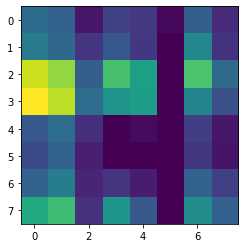

index: 370222
Error: 0.044180962422528634
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:54:56
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                   551
bunch_number                                                   54
ts_length                                                   65536
chunk                                                           9
Name: 2415, dtype: object


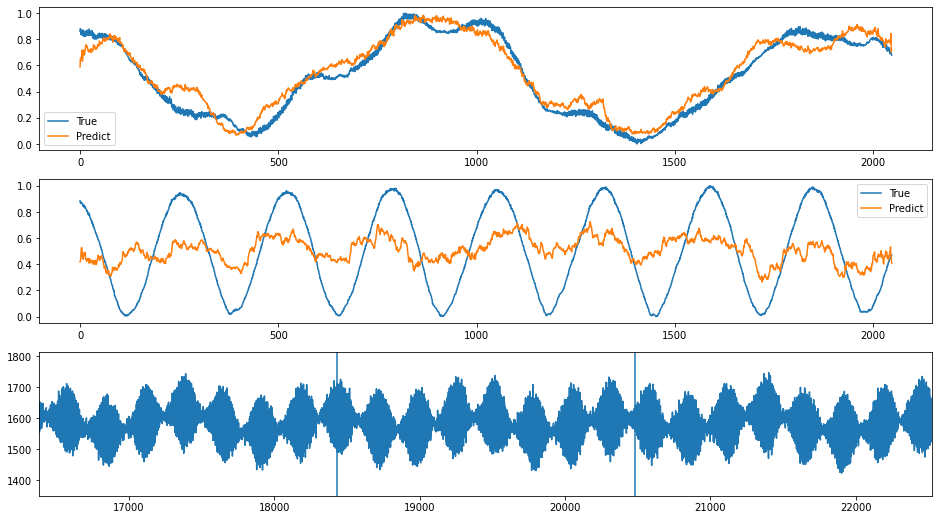

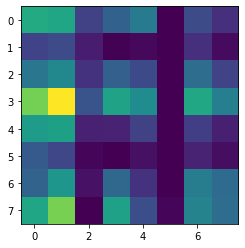

index: 201780
Error: 0.04410155437320008
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          11
Name: 2859, dtype: object


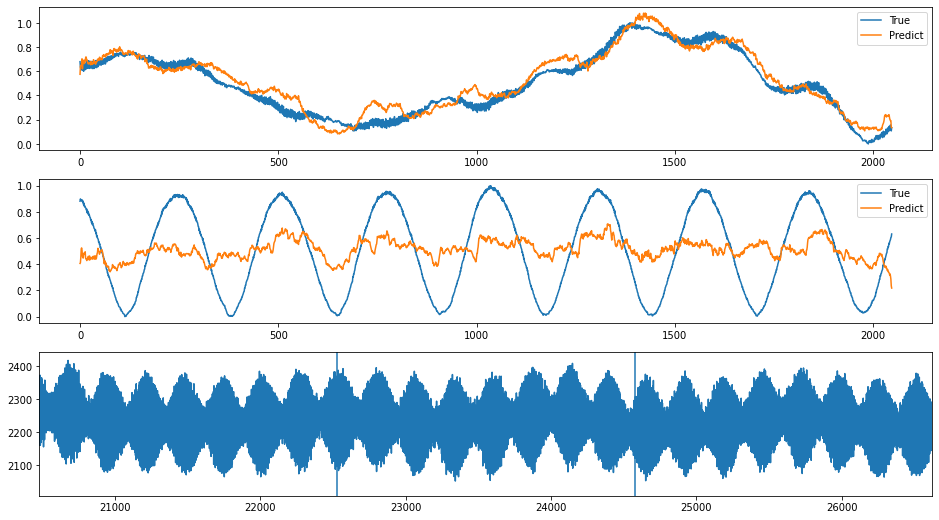

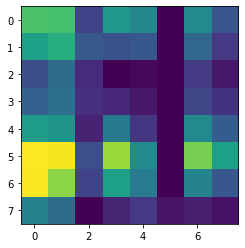

index: 199698
Error: 0.0440135397456883
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:50:48
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                  1558
bunch_number                                                   90
ts_length                                                   65536
chunk                                                          22
Name: 5675, dtype: object


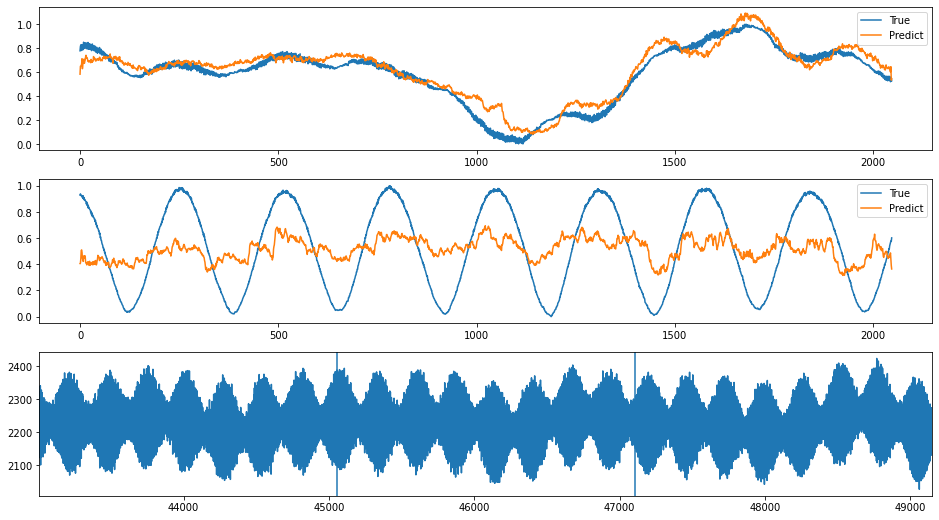

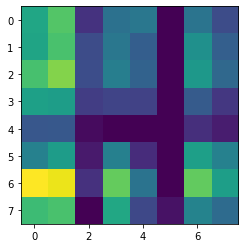

index: 111200
Error: 0.043982953376632244
type                                                         Inst
fill                                                         6936
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-17 15:14:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6936/...
n_bunches                                                    1308
bunch_index                                                  1669
bunch_number                                                 1221
ts_length                                                   65536
chunk                                                          15
Name: 3964, dtype: object


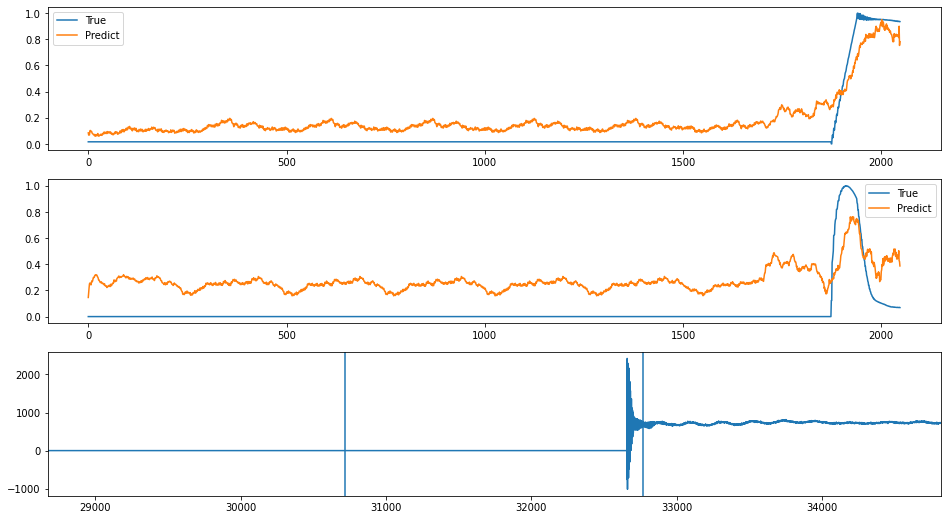

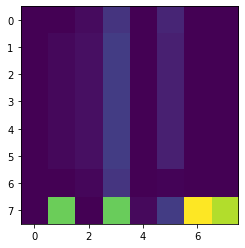

index: 365622
Error: 0.04391780930692874
type                                                         Inst
fill                                                         6451
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-12-02 22:54:56
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6451/...
n_bunches                                                     129
bunch_index                                                   551
bunch_number                                                   54
ts_length                                                   65536
chunk                                                          17
Name: 4463, dtype: object


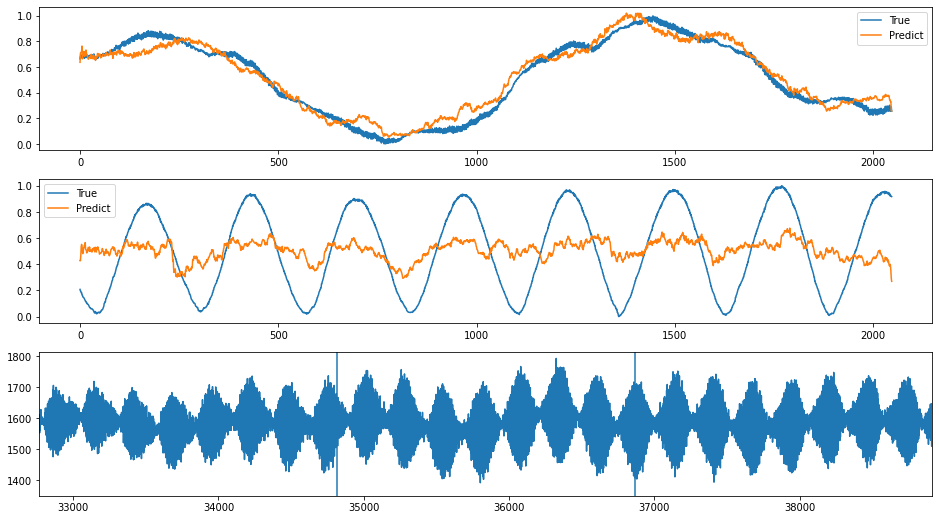

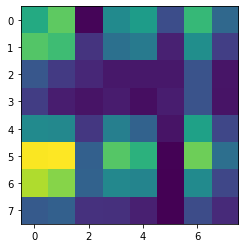

In [26]:
for i in range(1, 51):
    index = sorted_error_indices[-i]
    plot_train_index(index)

# Around the peak

In [27]:
error_around_peak = abs(train_error - hist_peak)
sorted_error_indices_around_peak = np.argsort(error_around_peak)

index: 82752
Error: 0.01040078154907529
type                                                         Inst
fill                                                         7475
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-26 17:45:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7475/...
n_bunches                                                     733
bunch_index                                                  1954
bunch_number                                                  413
ts_length                                                   65536
chunk                                                           4
Name: 1072, dtype: object


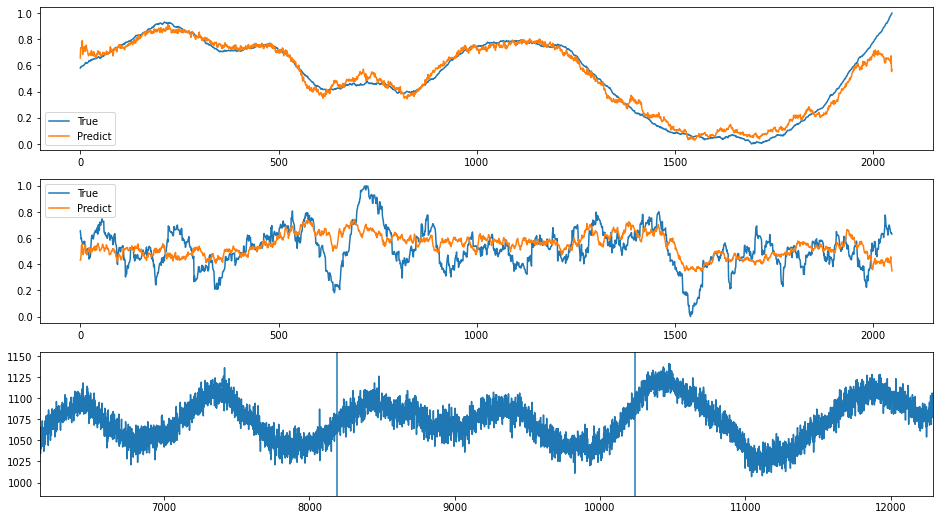

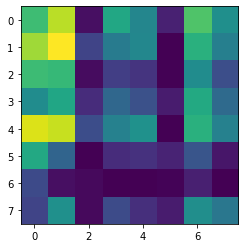

index: 239397
Error: 0.01040078814619027
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 21:22:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                  3215
bunch_number                                                 1783
ts_length                                                   65536
chunk                                                          23
Name: 6117, dtype: object


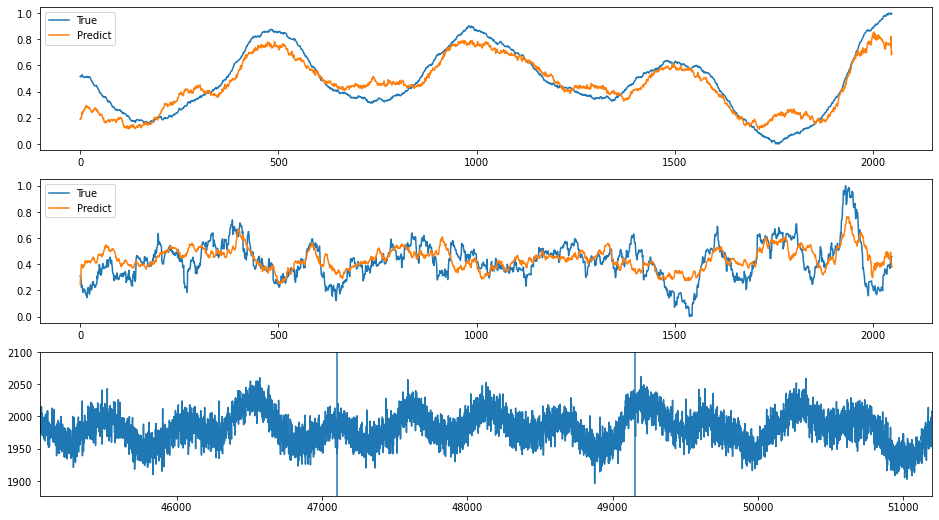

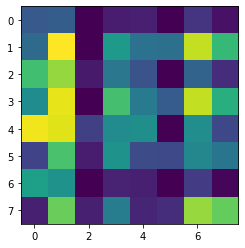

index: 123021
Error: 0.010400797115507399
type                                                         Inst
fill                                                         6687
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-15 15:53:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6687/...
n_bunches                                                     252
bunch_index                                                   215
bunch_number                                                  109
ts_length                                                   65536
chunk                                                          18
Name: 4609, dtype: object


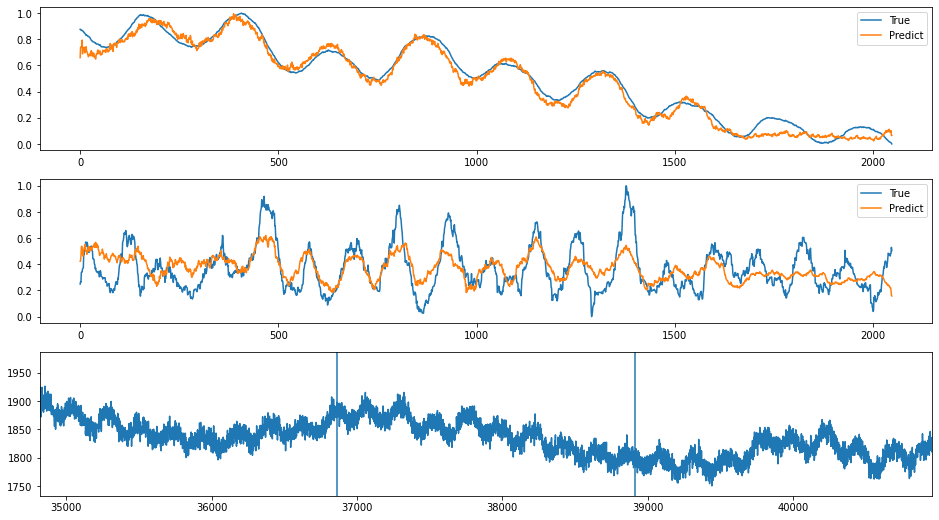

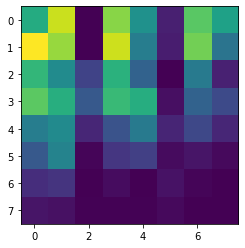

index: 266155
Error: 0.010400799259058218
type                                                         Inst
fill                                                         7378
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-28 23:47:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7378/...
n_bunches                                                     456
bunch_index                                                  1278
bunch_number                                                  312
ts_length                                                   65536
chunk                                                          28
Name: 7400, dtype: object


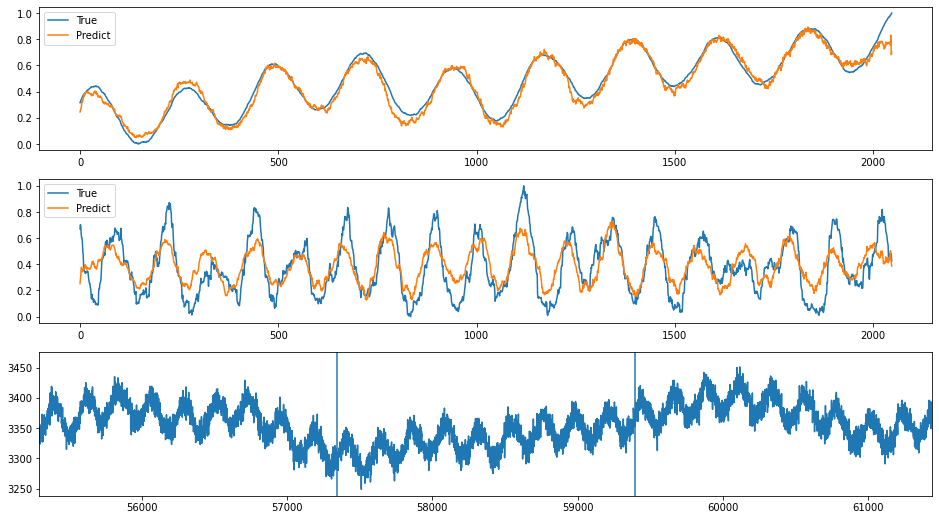

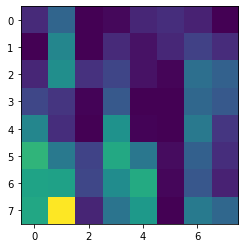

index: 56793
Error: 0.01040071241931532
type                                                         Inst
fill                                                         6690
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-16 02:57:12
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6690/...
n_bunches                                                     312
bunch_index                                                   283
bunch_number                                                  145
ts_length                                                   65536
chunk                                                           2
Name: 656, dtype: object


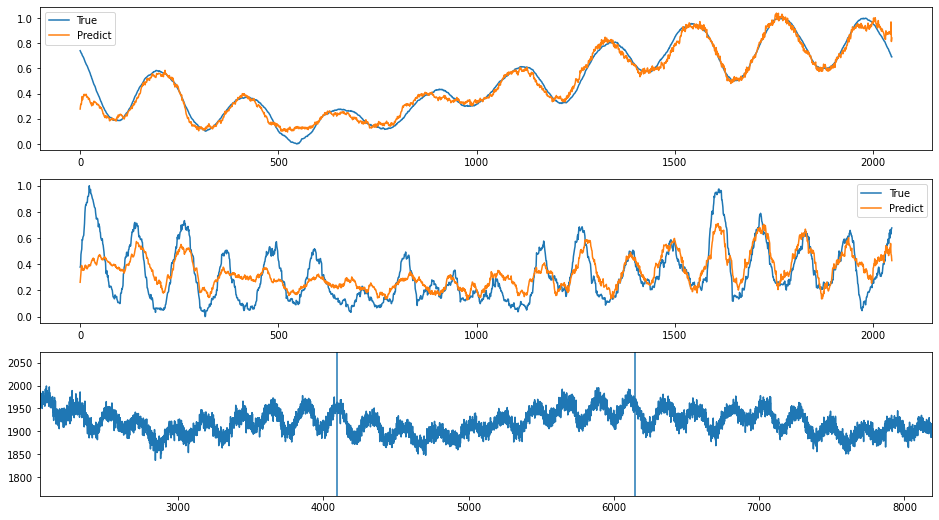

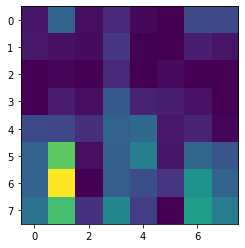

index: 85785
Error: 0.010400704406452323
type                                                         Inst
fill                                                         7488
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-12-01 07:43:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7488/...
n_bunches                                                     733
bunch_index                                                  3134
bunch_number                                                  661
ts_length                                                   65536
chunk                                                           1
Name: 398, dtype: object


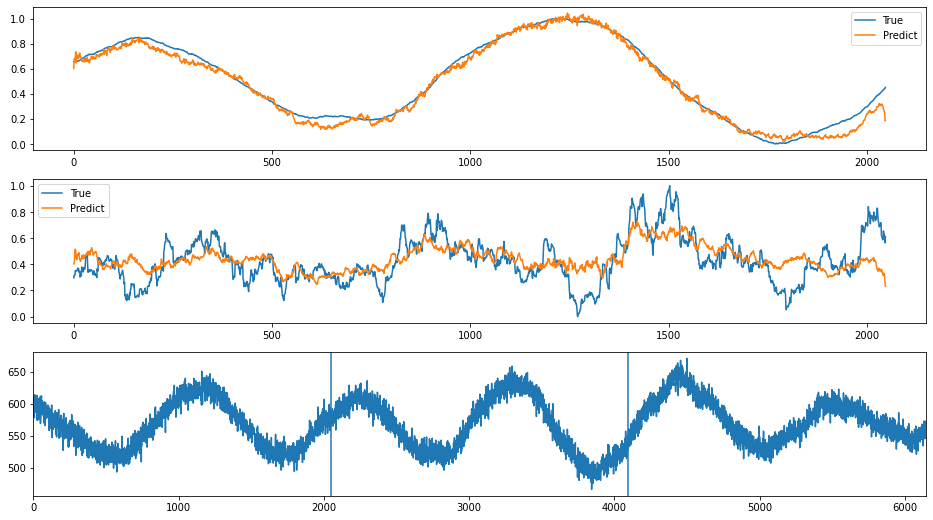

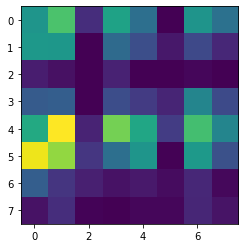

index: 337071
Error: 0.01040082490070323
type                                                         Inst
fill                                                         7448
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-16 07:23:16
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7448/...
n_bunches                                                     372
bunch_index                                                   615
bunch_number                                                  110
ts_length                                                   65536
chunk                                                          26
Name: 6891, dtype: object


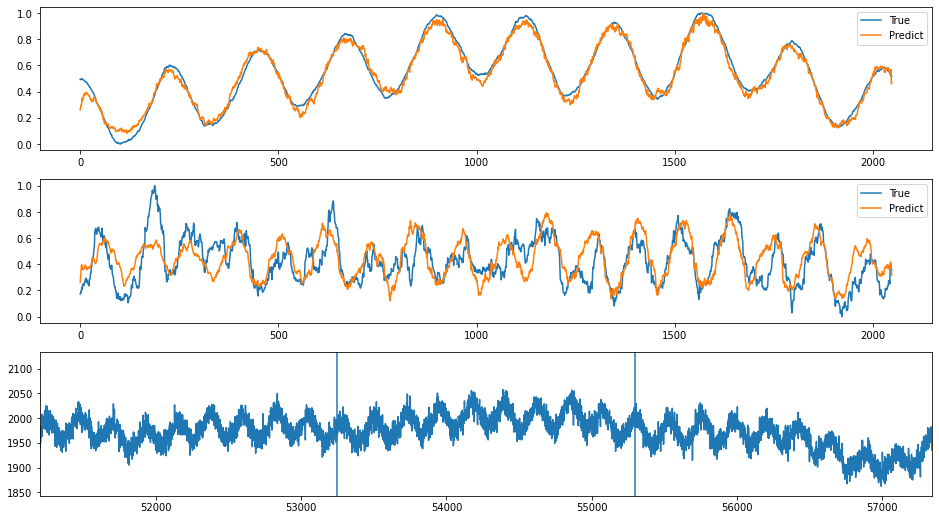

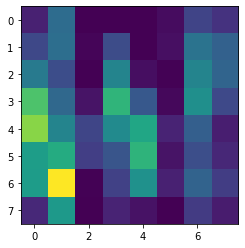

index: 351028
Error: 0.01040082616060092
type                                                         Inst
fill                                                         6860
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-28 16:43:34
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6860/...
n_bunches                                                     540
bunch_index                                                   528
bunch_number                                                  376
ts_length                                                   65536
chunk                                                          21
Name: 5575, dtype: object


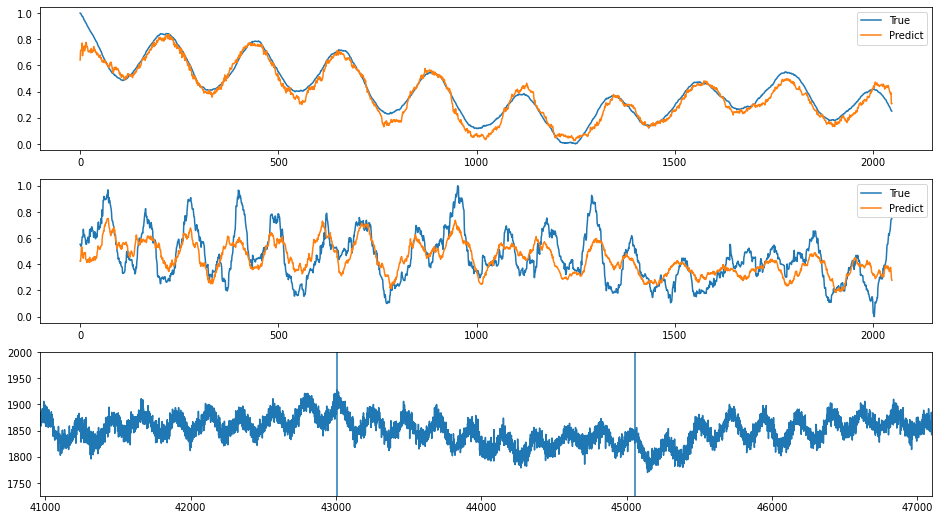

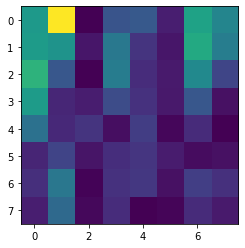

index: 160196
Error: 0.010400687343052066
type                                                         Inst
fill                                                         6390
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-15 22:37:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6390/...
n_bunches                                                    1836
bunch_index                                                  2954
bunch_number                                                 1563
ts_length                                                   65536
chunk                                                           2
Name: 687, dtype: object


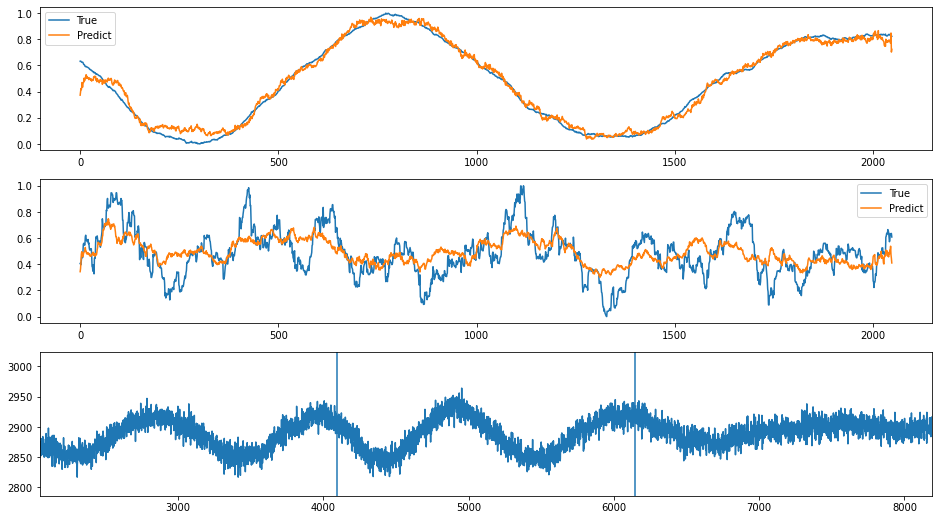

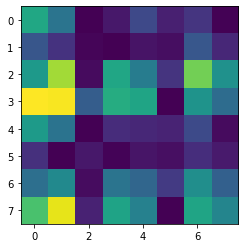

index: 147776
Error: 0.010400869453057064
type                                                         Inst
fill                                                         6347
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-30 10:49:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6347/...
n_bunches                                                     172
bunch_index                                                   224
bunch_number                                                  110
ts_length                                                   65536
chunk                                                           5
Name: 1534, dtype: object


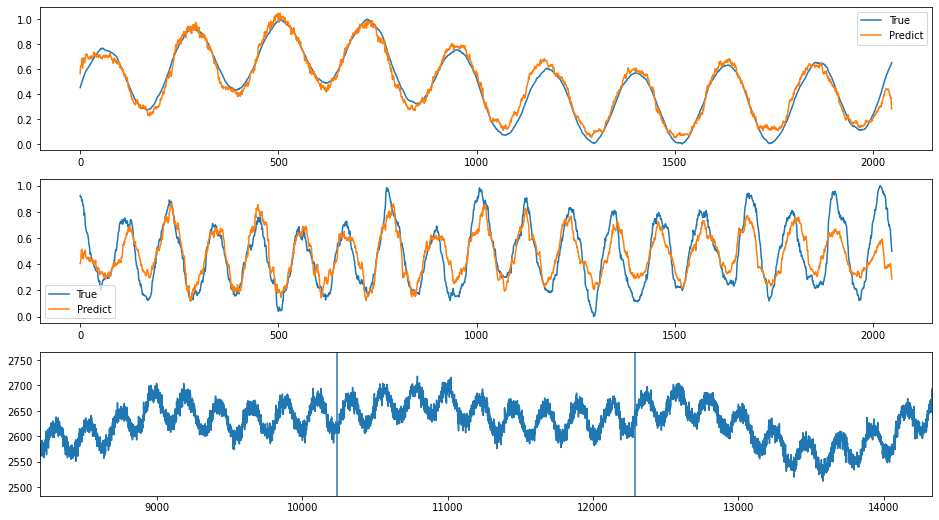

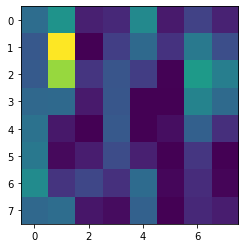

In [28]:
for i in range(10):
    index = sorted_error_indices_around_peak[i]
    plot_train_index(index)

# Around a point

In [29]:
# point = 

In [30]:
# error_around_peak = abs(train_error - point)
# sorted_error_indices_around_point = np.argsort(error_around_peak)

In [31]:
# for i in range(10):
#     index = sorted_error_indices_around_point[i]
#     plot_train_index(index)

# Clustering

In [32]:
indices = sorted_error_indices[-np.arange(1, 2048+1)]
encoding_true = train_data[indices]
encoding_pred = train_prediction[indices]
encoding_meta = train_meta.iloc[indices]
encoded = checker.encode(encoding_true)
encoded_2d = encoded.reshape(encoded.shape[0], -1)

In [33]:
encoded_2d.shape

(2048, 64)

In [34]:
def plot_clusters(cluster_indices):
    print(f"N samples: {len(cluster_indices)}")
    fig, axes = plt.subplots(2,1, figsize=(12, 3))
    axes[0].plot(encoding_true[cluster_indices][:,:, 0].T, linewidth=0, marker=',', alpha=0.1)
    axes[1].plot(encoding_true[cluster_indices][:,:, 1].T, linewidth=0, marker=',', alpha=0.1)
    return fig, axes

In [35]:
import sklearn
from sklearn.manifold import TSNE

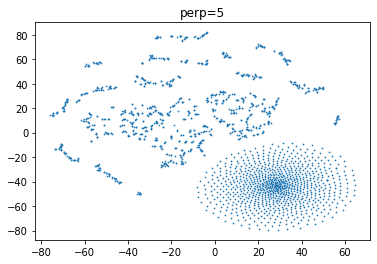

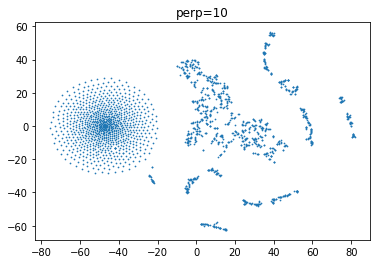

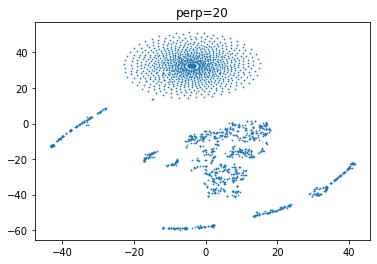

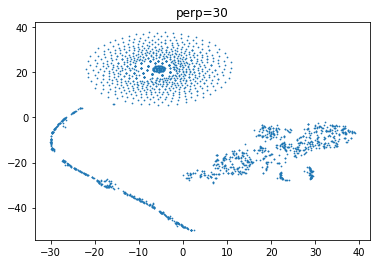

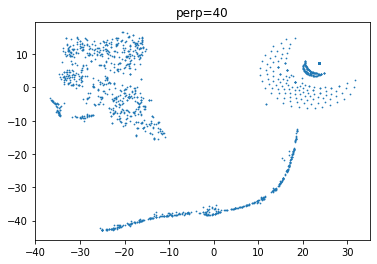

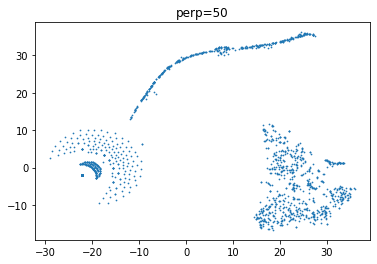

In [36]:
for perplexity in [5, 10, 20, 30, 40, 50]: 
    tsne = TSNE(perplexity=perplexity)
    encoded_2d_tsne = tsne.fit_transform(encoded_2d)
    plt.scatter(encoded_2d_tsne[:, 0], encoded_2d_tsne[:, 1], marker='.', s=2)
    plt.title(f"perp={perplexity}")
    plt.show()

In [37]:
tsne = TSNE(perplexity=30)
encoded_2d_tsne = tsne.fit_transform(encoded_2d)

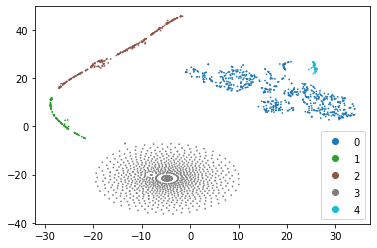

cluster 0
N samples: 661


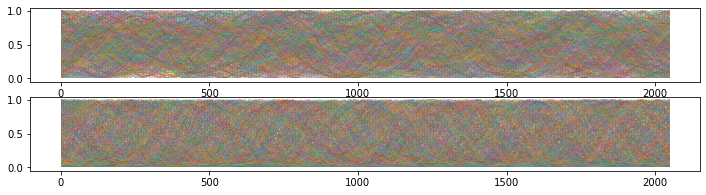

cluster 1
N samples: 121


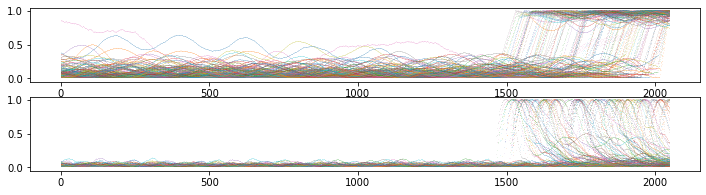

cluster 2
N samples: 282


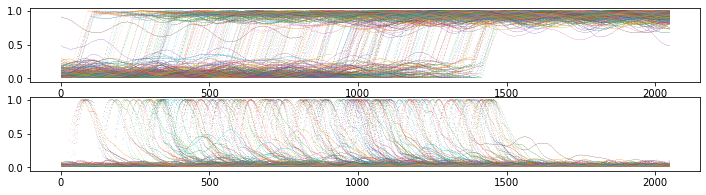

cluster 3
N samples: 940


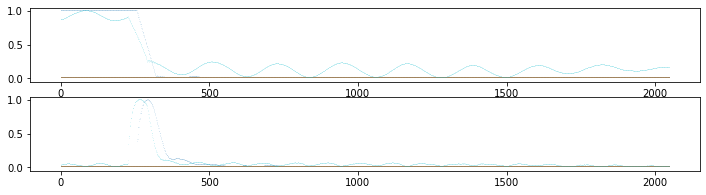

cluster 4
N samples: 44


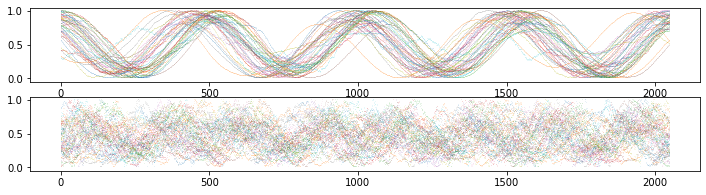

In [38]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=4)
clustering = dbscan.fit(encoded_2d_tsne)
sc = plt.scatter(encoded_2d_tsne[:, 0], encoded_2d_tsne[:, 1], marker='.', s=2, c=clustering.labels_, cmap='tab10')
plt.legend(*sc.legend_elements())
plt.show()
for cluster in np.unique(clustering.labels_):
    cluster_indices = np.where(clustering.labels_ == cluster)[0]
    print("cluster", cluster)
    fig, axes = plot_clusters(cluster_indices)
    plt.show()